# Quenching in the Green Valley at Low Redshift  
## A Comparative Analysis of AGN Host Galaxies in SDSS, IllustrisTNG, and EAGLE

---

**Author:** Gaurav Gawade  
**Affiliation:** St. Xavier's College, Mumbai, India  
**Version:** 2.1 — November 2025  
**Contact:** gauravgawade@proton.me  

This Jupyter notebook accompanies the manuscript:

*Quenching in the Green Valley at Low Redshift: A Comparative Analysis of AGN Host Galaxies in SDSS, IllustrisTNG, and EAGLE* (Gawade 2025, submitted).

**All code, data, and figures in this notebook are fully reproducible and open source.**  
For dataset and software citation, see the `CITATION.cff` and `README.md` files on the  
[GitHub Repository](https://github.com/TshapedAsh/Green-Valley-AGN-SDSS-TNG).

*Please see `README.md` and Zenodo for further documentation and data access.*


# Introduction

This study compares the stellar mass and specific star-formation rate (sSFR) distributions of low-redshift AGN host galaxies in SDSS DR7 ($z < 0.1$) with “green-valley” analogue **central** galaxies from the IllustrisTNG-100 (hereafter TNG) and EAGLE Ref-L0100N1504 simulations. The green valley, lying between the blue star-forming cloud and the red quiescent sequence in colour–mass space, is a key laboratory for testing galaxy-quenching pathways and the role of AGN feedback (Schawinski et al. 2014).

Our observational sample consists of optical BPT-selected AGN hosts in SDSS, with stellar masses and aperture-corrected total SFRs from the MPA–JHU value-added catalog. From TNG we select central galaxies at $z = 0$ (snapshot 99) and from EAGLE we select central galaxies at $z = 0$ (SnapNum = 28), applying a fixed stellar-mass threshold and defining “green-valley” analogues using percentile-based cuts in rest-frame $(g-r)$ colour. Crucially, these cuts are computed **independently for each simulation’s massive population**, to control for differences in intrinsic colour calibration and dust treatment.

By comparing the colour–mass plane, sSFR distributions, and sSFR–mass relations of SDSS AGN hosts to their simulation analogues, we test how well current cosmological models reproduce the demographics of transitioning AGN host galaxies. In particular, we examine (i) the presence, depth, and mass-dependence of the sSFR gap between star-forming and quenched systems, and (ii) contrasts in quenching efficiency between TNG and EAGLE arising from their distinct AGN feedback implementations (Weinberger et al. 2017; Schaye et al. 2015).

All sample sizes, selection criteria, and data cuts used in the figures below match those described in the manuscript’s **Methods** section and are implemented explicitly in this notebook.

---

### Key References

- [Kauffmann et al. (2003)](https://doi.org/10.1046/j.1365-8711.2003.06291.x): BPT classification for star-forming galaxies.  
- [Kewley et al. (2001)](https://doi.org/10.1086/321545): Theoretical AGN boundary on the BPT diagram.  
- [Pillepich et al. (2018)](https://doi.org/10.1093/mnras/stx3112): IllustrisTNG simulation suite.  
- [Schaye et al. (2015)](https://doi.org/10.1093/mnras/stu2058): The EAGLE Project.  
- [Schawinski et al. (2014)](https://doi.org/10.1093/mnras/stu327): Quenching timescales and the green valley.  
- [Weinberger et al. (2017)](https://doi.org/10.1093/mnras/stw2944): AGN feedback implementation in TNG.

---

# Units and Conventions

- **Stellar Mass**  
  - All stellar masses are expressed in solar units ($M_\odot$).  
  - TNG stellar masses are converted to physical units using $h = 0.6774$ (Pillepich et al. 2018).  
  - EAGLE stellar masses are converted using $h = 0.6777$ (Schaye et al. 2015).  
  - Unless stated otherwise, plots use $\log_{10}(M_*/M_\odot)$.

- **Star-formation Rate (SFR) and Specific SFR (sSFR)**  
  - SFRs are in $M_\odot\,\mathrm{yr}^{-1}$ and  
    $$\mathrm{sSFR} = \frac{\mathrm{SFR}}{M_*} \; [\mathrm{yr}^{-1}].$$
  - For quenched simulated galaxies, we impose a small numerical floor  
    $$\mathrm{SFR}_\mathrm{eff} = \mathrm{SFR} + 10^{-4}\,M_\odot\,\mathrm{yr}^{-1},$$  
    to avoid undefined logarithms.  
  - All sSFR values are reported in $\log_{10}(\mathrm{sSFR/yr^{-1}})$.

- **Redshift / Snapshots**  
  - **SDSS:** $z < 0.1$.  
  - **TNG100:** Snapshot 99 at $z = 0$.  
  - **EAGLE:** Snapshot 28 at $z = 0$.  
  - These snapshots represent the present-day galaxy population.

- **Photometry and Colours**  
  - **SDSS:** Observed-frame *fiber* magnitudes (`PLUG_MAG`) in the $g$ and $r$ bands.  
    At $z < 0.1$, k-corrections are small, and fiber colours effectively trace the nuclear stellar populations of AGN host galaxies.  
  - **TNG:** Synthetic rest-frame SDSS-like photometry within a 30 kpc aperture, including dust attenuation via the Charlot & Fall (2000) model (`cf00dust`).  
  - **EAGLE:** Synthetic rest-frame photometry within a 30 kpc aperture using **intrinsic dust-free** (`nodust`) magnitudes.  

  **Because SDSS, TNG, and EAGLE differ in photometric calibration (fiber vs. aperture; dusty vs. dust-free), Green-Valley selection is performed via simulation-specific colour percentiles.**  
  This ensures a calibration-independent comparison of relative evolutionary states across datasets.


---
## Setup & Configuration

Import libraries, set global plotting style (paper context), suppress non‐critical warnings, and define any global paths/constants.

In [2]:
# =============================================================================
# Cell 1: Setup and Configuration
# Import core libraries, set plotting style, define paths.
# =============================================================================

import os
import glob
import warnings

import numpy as np
import pandas as pd
import h5py

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import seaborn as sns

from astropy.io import fits
from scipy.stats import ks_2samp


# -------------------------------------------------------------------------
# Global helper functions (reused across figures)
# -------------------------------------------------------------------------

def get_bootstrap_stats(data, n_boot=5000, ci=68, seed=42):
    """Calculate the median and asymmetric confidence interval via bootstrap.

    Parameters
    ----------
    data : array-like
        Input sample.
    n_boot : int, optional
        Number of bootstrap resamples.
    ci : float, optional
        Central confidence interval in percent (e.g. 68 for 16–84th percentile).
    seed : int, optional
        Seed for :func:`numpy.random.default_rng`.

    Returns
    -------
    median : float
        Sample median.
    err_up : float
        Upper error (median + err_up corresponds to the upper CI bound).
    err_down : float
        Lower error (median - err_down corresponds to the lower CI bound).
    """
    data = np.asarray(data)
    data = data[~np.isnan(data)]
    if data.size == 0:
        return np.nan, np.nan, np.nan

    rng = np.random.default_rng(seed)
    boot_meds = [
        np.median(rng.choice(data, size=data.size, replace=True))
        for _ in range(n_boot)
    ]

    med_val = np.median(data)
    lower, upper = np.percentile(
        boot_meds,
        [(100.0 - ci) / 2.0, 50.0 + ci / 2.0],
    )
    return med_val, upper - med_val, med_val - lower


def format_p_value(p):
    """Return a LaTeX-formatted p-value string.

    Very small values are rendered compactly as powers of ten.
    """
    if p == 0:
        return "0"
    if p < 1e-300:
        return r"< 10^{-300}"
    exponent = int(np.floor(np.log10(abs(p))))
    base = p / 10.0**exponent
    return rf"{base:.2f}\times 10^{{{exponent}}}"

# Note: Specialized imports (e.g., patheffects, Line2D) are imported 
# within individual plotting cells for context clarity.

# Suppress non-critical warnings
warnings.filterwarnings('ignore')

# Base notebook plotting style (figure cells override with MNRAS rc_context)
sns.set_theme(style="white", context="paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 150  # High-DPI saves are set in each figure cell

# Define relative input/output paths
INPUT_DIR = os.path.abspath('./data/')
OUTPUT_DIR = os.path.abspath('./outputs/figures/')
os.makedirs(OUTPUT_DIR, exist_ok=True)

# -------------------------------------------------------------------------
# Predefine key DataFrames to avoid rerun errors (executing cells out of order)
# -------------------------------------------------------------------------

df_clean                 = pd.DataFrame()  # SDSS cleaned catalogue
df_final_matched         = pd.DataFrame()  # SDSS AGN + Control matched sample

df_tng_clean             = pd.DataFrame()  # TNG catalogue (cleaned)
tng_green_valley_hosts   = pd.DataFrame()  # TNG GV analogue sample

df_eagle_clean           = pd.DataFrame()  # EAGLE catalogue (cleaned)
eagle_green_valley_hosts = pd.DataFrame()  # EAGLE GV analogue sample

massive_galaxies         = pd.DataFrame()  # Used for mass-limited GV window definitions

# -------------------------------------------------------------------------
# Initialize Green Valley boundaries (critical: use NaN, not 0)
# -------------------------------------------------------------------------
gv_color_lower, gv_color_upper = np.nan, np.nan            # TNG-based GV bounds
gv_color_lower_eagle, gv_color_upper_eagle = np.nan, np.nan # EAGLE GV bounds

print("--- Setup Complete ---")
print(f"Input data will be read from:  {INPUT_DIR}")
print(f"Output files will be saved to: {OUTPUT_DIR}")

--- Setup Complete ---
Input data will be read from:  T:\AGN_project\AGN_Project\data
Output files will be saved to: T:\AGN_project\AGN_Project\outputs\figures


---
## SDSS Data: Loading, Cleaning & BPT Classification

Load SDSS DR7 catalogs, apply S/N cuts, compute emission‐line ratios, and classify into Star-forming/Composite/AGN using K03/K01 lines.

In [3]:
# =============================================================================
# Cell 2: SDSS Data Preparation
# Loads, merges, classifies, and matches SDSS data (output: df_final_matched)
# =============================================================================

print("\n--- PART 1: SDSS Data Preparation ---")

try:
    print("Loading SDSS catalogs...")

    # -------------------------------------------------------------------------
    # Base photometry & redshift table (positions, redshift, fiber magnitudes)
    # NOTE:
    #   SDSS PLUG_MAG values are *observed-frame fiber magnitudes* (3" aperture).
    #   These are NOT k-corrected rest-frame colours. At z < 0.1 this is acceptable,
    #   and fiber colours trace nuclear stellar populations hosting the AGN.
    #
    #   Simulations (TNG, EAGLE) use 30 kpc *total* synthetic magnitudes.
    #   To avoid cross-calibration bias, each dataset uses its own percentile-based
    #   Green Valley thresholds (defined later).
    # -------------------------------------------------------------------------

    with fits.open(os.path.join(INPUT_DIR, 'gal_info_dr7_v5_2.fit')) as hdul:
        info_data = hdul[1].data
        df_info = pd.DataFrame({
            'PLATEID':    info_data['PLATEID'].byteswap().newbyteorder(),
            'MJD':        info_data['MJD'].byteswap().newbyteorder(),
            'FIBERID':    info_data['FIBERID'].byteswap().newbyteorder(),
            'Z':          info_data['Z'].byteswap().newbyteorder(),
            'PLUGMAG_G':  info_data['PLUG_MAG'][:, 1].byteswap().newbyteorder(),
            'PLUGMAG_R':  info_data['PLUG_MAG'][:, 2].byteswap().newbyteorder()
        })
    print(f"Loaded galaxy info: {len(df_info):,} galaxies.")

    # -------------------------------------------------------------------------
    # Stellar mass (LGM_TOT_P50) and SFR (LOG_SFR) from MPA-JHU
    # -------------------------------------------------------------------------
    with fits.open(os.path.join(INPUT_DIR, 'totlgm_dr7_v5_2b.fit')) as hdul:
        df_info['LGM_TOT_P50'] = hdul[1].data['MEDIAN'].byteswap().newbyteorder()

    with fits.open(os.path.join(INPUT_DIR, 'gal_totsfr_dr7_v5_2.fits')) as hdul:
        df_info['LOG_SFR'] = hdul[1].data['MEDIAN'].byteswap().newbyteorder()

    # -------------------------------------------------------------------------
    # Emission-line table (Hα, Hβ, [NII], [OIII] fluxes & uncertainties)
    # NOTE: This MPA–JHU line file does NOT contain MJD. In this DR7 product,
    #       it is row-aligned with gal_info (same PLATEID+FIBERID ordering).
    #       We therefore perform a strict row-alignment check and then concat,
    #       rather than a merge on (PLATEID,FIBERID), which can inflate rows.
    # -------------------------------------------------------------------------
    with fits.open(os.path.join(INPUT_DIR, 'gal_line_dr7_v5_2.fit')) as hdul:
        line_data = hdul[1].data
        df_line = pd.DataFrame({
            'PLATEID':            line_data['PLATEID'].byteswap().newbyteorder(),
            'FIBERID':            line_data['FIBERID'].byteswap().newbyteorder(),
            'H_ALPHA_FLUX':       line_data['H_ALPHA_FLUX'].byteswap().newbyteorder(),
            'H_ALPHA_FLUX_ERR':   line_data['H_ALPHA_FLUX_ERR'].byteswap().newbyteorder(),
            'H_BETA_FLUX':        line_data['H_BETA_FLUX'].byteswap().newbyteorder(),
            'H_BETA_FLUX_ERR':    line_data['H_BETA_FLUX_ERR'].byteswap().newbyteorder(),
            'NII_6584_FLUX':      line_data['NII_6584_FLUX'].byteswap().newbyteorder(),
            'NII_6584_FLUX_ERR':  line_data['NII_6584_FLUX_ERR'].byteswap().newbyteorder(),
            'OIII_5007_FLUX':     line_data['OIII_5007_FLUX'].byteswap().newbyteorder(),
            'OIII_5007_FLUX_ERR': line_data['OIII_5007_FLUX_ERR'].byteswap().newbyteorder(),
        })

    print(f"Loaded emission-line table: {len(df_line):,} galaxies.")

    # -------------------------------------------------------------------------
    # Combine photometry + mass/SFR + emission lines (row-aligned concat)
    # -------------------------------------------------------------------------
    print("Combining SDSS tables (row-aligned concat; avoids many-to-many merge)...")

    if len(df_info) != len(df_line):
        raise ValueError(
            f"Length mismatch: df_info={len(df_info):,} vs df_line={len(df_line):,}. "
            "Cannot safely align by row index."
        )

    same_plate = np.array_equal(df_info['PLATEID'].values, df_line['PLATEID'].values)
    same_fiber = np.array_equal(df_info['FIBERID'].values, df_line['FIBERID'].values)
    if not (same_plate and same_fiber):
        raise ValueError(
            "Row-alignment check failed: (PLATEID,FIBERID) do not match row-by-row "
            "between df_info and df_line. Aborting to prevent incorrect joins."
        )

    # Safe concat: drop duplicate key columns from df_line
    df_full = pd.concat(
        [
            df_info.reset_index(drop=True),
            df_line.drop(columns=['PLATEID', 'FIBERID']).reset_index(drop=True)
        ],
        axis=1
    )

    print(f"Combined: {len(df_full):,} galaxies.")

    # Replace infinities
    df_full.replace([np.inf, -np.inf], np.nan, inplace=True)

    # -------------------------------------------------------------------------
    # QUALITY CUTS: S/N > 3 in all four BPT lines + valid mass + valid SFR
    # -------------------------------------------------------------------------
    sn_ha   = (df_full['H_ALPHA_FLUX']   / df_full['H_ALPHA_FLUX_ERR']   > 3)
    sn_hb   = (df_full['H_BETA_FLUX']    / df_full['H_BETA_FLUX_ERR']    > 3)
    sn_nii  = (df_full['NII_6584_FLUX']  / df_full['NII_6584_FLUX_ERR']  > 3)
    sn_oiii = (df_full['OIII_5007_FLUX'] / df_full['OIII_5007_FLUX_ERR'] > 3)

    df_clean = df_full[
        sn_ha & sn_hb & sn_nii & sn_oiii &
        df_full['LGM_TOT_P50'].notna() &
        df_full['LOG_SFR'].notna()
    ].copy()

    dropped = len(df_full) - len(df_clean)
    print(f"Dropped {dropped:,} rows due to S/N or missing mass/SFR "
          f"({(dropped / len(df_full) * 100):.2f}%).")
    print(f"Remaining after quality cuts: {len(df_clean):,}")

    # -------------------------------------------------------------------------
    # Redshift cut: local Universe (z < 0.1)
    # -------------------------------------------------------------------------
    df_clean = df_clean[df_clean['Z'] < 0.1].copy()
    print(f"Remaining after z < 0.1: {len(df_clean):,}")

    if df_clean.empty:
        raise ValueError("SDSS DataFrame is empty after filtering — check S/N or z cuts.")

    # -------------------------------------------------------------------------
    # BPT ratios and fiber colour
    # -------------------------------------------------------------------------
    df_clean['log_NII_Ha']  = np.log10(df_clean['NII_6584_FLUX']  / df_clean['H_ALPHA_FLUX'])
    df_clean['log_OIII_Hb'] = np.log10(df_clean['OIII_5007_FLUX'] / df_clean['H_BETA_FLUX'])
    df_clean['g_minus_r']   = df_clean['PLUGMAG_G'] - df_clean['PLUGMAG_R']
    df_clean.dropna(subset=['log_NII_Ha', 'log_OIII_Hb'], inplace=True)

    # -------------------------------------------------------------------------
    # BPT Classification (Kewley+2001 for AGN, Kauffmann+2003 for SF boundary)
    # -------------------------------------------------------------------------
    def classify_bpt(df):
        kewley    = lambda x: 0.61 / (x - 0.47) + 1.19
        kauffmann = lambda x: 0.61 / (x - 0.05) + 1.30

        df['bpt_class'] = np.where(
            df['log_OIII_Hb'] > kewley(df['log_NII_Ha']), 'AGN',
            np.where(
                df['log_OIII_Hb'] > kauffmann(df['log_NII_Ha']), 'Composite',
                'Star-forming'
            )
        )
        return df

    df_clean = classify_bpt(df_clean)

    # Extract pure AGN (above Kewley)
    df_agn = df_clean[df_clean['bpt_class'] == 'AGN'].copy()
    df_sf  = df_clean[df_clean['bpt_class'] == 'Star-forming'].copy()

    # Compute log sSFR = logSFR – logM*
    df_agn['LOG_SSFR'] = df_agn['LOG_SFR'] - df_agn['LGM_TOT_P50']
    df_sf['LOG_SSFR']  = df_sf['LOG_SFR']  - df_sf['LGM_TOT_P50']

    # -------------------------------------------------------------------------
    # Matched control sample: z–mag bin matching (50×50) with fixed seed
    # -------------------------------------------------------------------------
    print("Constructing matched control sample (z-mag bin matching, seed=42)...")

    z_bins   = np.linspace(df_clean['Z'].min(), df_clean['Z'].max(), 50)
    mag_bins = np.linspace(df_clean['PLUGMAG_R'].min(), df_clean['PLUGMAG_R'].max(), 50)

    df_agn['z_bin']   = np.digitize(df_agn['Z'], z_bins)
    df_agn['mag_bin'] = np.digitize(df_agn['PLUGMAG_R'], mag_bins)
    df_sf['z_bin']    = np.digitize(df_sf['Z'], z_bins)
    df_sf['mag_bin']  = np.digitize(df_sf['PLUGMAG_R'], mag_bins)

    np.random.seed(42)
    df_agn['random_key'] = np.random.rand(len(df_agn))
    df_sf['random_key']  = np.random.rand(len(df_sf))

    df_agn['match_rank'] = df_agn.sort_values('random_key').groupby(['z_bin', 'mag_bin']).cumcount()
    df_sf['match_rank']  = df_sf.sort_values('random_key').groupby(['z_bin', 'mag_bin']).cumcount()

    df_final_matched = pd.merge(
        df_agn.drop(columns=['random_key']),
        df_sf.drop(columns=['random_key']),
        on=['z_bin', 'mag_bin', 'match_rank'],
        how='inner',
        suffixes=('_agn', '_ctrl')
    )

    print(f"Matched control sample: {len(df_final_matched):,} AGN–SF pairs.")

    # -------------------------------------------------------------------------
    # Mass cut: remove low-mass dwarfs (consistent with simulation mass floors)
    # -------------------------------------------------------------------------
    df_final_matched = df_final_matched[
        (df_final_matched['LGM_TOT_P50_agn']  > 8.0) &
        (df_final_matched['LGM_TOT_P50_ctrl'] > 8.0)
    ].copy()

    print(f"✅ SDSS processing complete. Final matched sample size: {len(df_final_matched):,}")

except Exception as e:
    print(f"❌ ERROR IN SDSS PROCESSING: {e}")
    raise


--- PART 1: SDSS Data Preparation ---
Loading SDSS catalogs...
Loaded galaxy info: 927,552 galaxies.
Loaded emission-line table: 927,552 galaxies.
Combining SDSS tables (row-aligned concat; avoids many-to-many merge)...
Combined: 927,552 galaxies.
Dropped 527,016 rows due to S/N or missing mass/SFR (56.82%).
Remaining after quality cuts: 400,536
Remaining after z < 0.1: 250,049
Constructing matched control sample (z-mag bin matching, seed=42)...
Matched control sample: 19,098 AGN–SF pairs.
✅ SDSS processing complete. Final matched sample size: 19,039


---
## IllustrisTNG Data: Loading & Green-Valley Definition

Load TNG-100 catalogs, extract stellar mass, g–r colour, sSFR; define green-valley via 75th–95th percentile in colour for log M* > 10.

In [4]:
# =============================================================================
# Cell 3: TNG Data Preparation (robust, reviewer-ready)
# Loads TNG masses, photometry (cf00dust = Charlot&Fall dust), SFRs and selects
# Green-Valley analogues using percentile-based colour bounds computed on the
# TNG massive population (log M* > 10).
# =============================================================================
print("\n--- PART 2: TNG Data Preparation ---")

try:
    print("Loading TNG catalogs...")

    # -------------------------
    # Helper: green-valley bounds
    # -------------------------
    def get_gv_bounds(df_massive, lower_p=0.75, upper_p=0.95):
        """
        Compute green-valley g-r bounds from the given massive-galaxy DataFrame.
        Returns (lower_bound, upper_bound).
        """
        vals = df_massive['g_minus_r']
        vals = vals[np.isfinite(vals)]
        if vals.size == 0:
            return np.nan, np.nan
        return vals.quantile(lower_p), vals.quantile(upper_p)

    # -------------------------
    # 1) Aperture masses (30 kpc) — convert to physical Msun (h=0.6774)
    # -------------------------
    with h5py.File(os.path.join(INPUT_DIR, 'aperture_masses.hdf5'), 'r') as f:
        df_mass_tng = pd.DataFrame({
            'SubfindID': f['Snapshot_99/SubfindID'][:].astype(int),
            'M_star_30kpc': f['Snapshot_99/SubhaloStellarMass_in_r30pkpc'][:].astype(float)
        })
    print(f"Loaded aperture mass table: {len(df_mass_tng):,} subhalos.")

    # -------------------------
    # 2) Synthetic photometry (rest-frame, cf00dust = Charlot & Fall attenuation)
    #    NOTE: cf00dust is a dust-attenuated magnitude set (not dust-free).
    # -------------------------
    with h5py.File(os.path.join(INPUT_DIR, 'stellar_photometry.99.hdf5'), 'r') as f:
        # photometry file has authoritative global subhalo ID ordering
        if 'subhaloIDs' in f:
            sub_ids = f['subhaloIDs'][:].astype(int)
        else:
            # extremely unlikely given your sanity check, but keep safe
            sub_ids = np.arange(f['Subhalo_StellarPhot_p07c_cf00dust_res_conv_ns1_rad30pkpc'].shape[0]).astype(int)

        df_photo_tng = pd.DataFrame({
            'SubfindID': sub_ids,
            'g_mag': f['Subhalo_StellarPhot_p07c_cf00dust_res_conv_ns1_rad30pkpc'][:, 2, 0],
            'r_mag': f['Subhalo_StellarPhot_p07c_cf00dust_res_conv_ns1_rad30pkpc'][:, 3, 0]
        })

    df_photo_tng['SubfindID'] = df_photo_tng['SubfindID'].astype(int)
    print(f"Loaded photometry table: {len(df_photo_tng):,} subhalos (rest-frame, cf00dust - dust attenuated).")

    # -------------------------
    # 3) SFR and central IDs from groupcat files (robust concatenation + real IDs)
    #    IMPORTANT: Your groupcat chunks do not include Subhalo IDs, so we align
    #    SFR to the photometry `subhaloIDs` ordering after verifying the lengths match.
    # -------------------------
    sfr_files = sorted(glob.glob(os.path.join(INPUT_DIR, 'groupcat-99.*.hdf5')))
    if not sfr_files:
        raise FileNotFoundError("No TNG groupcat files found (expect ~448).")

    print(f"Found {len(sfr_files)} TNG groupcat files. Concatenating SubhaloSFR and GroupFirstSub...")

    sfr_chunks = []
    firstsub_chunks = []
    missing_sfr_files = []
    missing_firstsub_files = []

    for fpath in sfr_files:
        with h5py.File(fpath, 'r') as f:
            # Centrals: GroupFirstSub
            if 'Group/GroupFirstSub' in f:
                firstsub_chunks.append(f['Group/GroupFirstSub'][:].astype(int))
            else:
                missing_firstsub_files.append(os.path.basename(fpath))

            # SFR: SubhaloSFR
            if 'Subhalo/SubhaloSFR' in f:
                sfr_chunks.append(f['Subhalo/SubhaloSFR'][:].astype(float))
            else:
                missing_sfr_files.append(os.path.basename(fpath))

    if len(sfr_chunks) == 0:
        raise ValueError("No Subhalo/SubhaloSFR datasets were found in any groupcat files.")

    all_sfrs = np.concatenate(sfr_chunks)
    central_ids = np.concatenate(firstsub_chunks) if len(firstsub_chunks) else np.array([], dtype=int)

    # Safety check: SFR length must match photometry ID length
    n_photo = len(df_photo_tng)
    if len(all_sfrs) != n_photo:
        raise ValueError(
            f"Length mismatch: concatenated SFR has {len(all_sfrs)} entries "
            f"but photometry has {n_photo} subhaloIDs. Cannot safely align."
        )

    # Build SFR table keyed by true SubfindIDs from photometry
    df_sfr_tng = pd.DataFrame({
        'SubfindID': df_photo_tng['SubfindID'].values,
        'SFR_TNG': all_sfrs
    })

    print(f"Built SFR table aligned to photometry subhaloIDs: {len(df_sfr_tng):,} entries.")
    print(f"Missing SubhaloSFR in {len(missing_sfr_files)} files (skipped).")
    print(f"Missing GroupFirstSub in {len(missing_firstsub_files)} files (skipped).")

    # central ids cleanup
    central_ids = np.unique(np.array(central_ids, dtype=int))
    central_ids = central_ids[central_ids >= 0]
    print(f"Number of centrals identified: {len(central_ids):,}")

    # -------------------------
    # 4) Join tables safely and compute log_M_star
    # -------------------------
    # Convert mass to physical Msun (divide by h)
    mass_in_msun = df_mass_tng['M_star_30kpc'].astype(float) / 0.6774
    df_mass_tng = df_mass_tng.loc[mass_in_msun > 0].copy()
    df_mass_tng['mass_in_msun'] = mass_in_msun.loc[df_mass_tng.index]
    df_mass_tng['log_M_star'] = np.log10(df_mass_tng['mass_in_msun'])

    print(f"Mass table after filtering M_star > 0: {len(df_mass_tng):,}")

    # Merge mass <-> photo <-> sfr on SubfindID
    df_tng_full = pd.merge(
        df_mass_tng[['SubfindID', 'log_M_star', 'mass_in_msun']],
        df_photo_tng[['SubfindID', 'g_mag', 'r_mag']],
        on='SubfindID', how='inner'
    )
    df_tng_full = pd.merge(
        df_tng_full,
        df_sfr_tng[['SubfindID', 'SFR_TNG']],
        on='SubfindID', how='inner'
    )
    df_tng_full['g_minus_r'] = df_tng_full['g_mag'] - df_tng_full['r_mag']

    print(f"After joining mass, photometry and SFR: {len(df_tng_full):,} subhalos (pre-central cut).")

    # -------------------------
    # 5) Select centrals only (if central IDs were found)
    # -------------------------
    if len(central_ids) > 0:
        df_tng_full = df_tng_full[df_tng_full['SubfindID'].isin(central_ids)].copy()
        print(f"After selecting centrals: {len(df_tng_full):,}.")
    else:
        print("No central mapping found — proceeding without an explicit central cut (check groupcat inputs).")

    # -------------------------
    # 6) Basic cleaning: remove low-mass galaxies
    # -------------------------
    df_tng_clean = df_tng_full[df_tng_full['log_M_star'] > 9.0].dropna().copy()
    print(f"After log(M_star) > 9: {len(df_tng_clean):,}.")

    if df_tng_clean.empty:
        raise ValueError("TNG DataFrame is empty after filtering. Check mass or color cuts.")

    # -------------------------
    # 7) Compute TNG Green Valley (percentile window on massive centrals)
    # -------------------------
    print("Selecting TNG Green Valley sample...")
    massive_galaxies = df_tng_clean[df_tng_clean['log_M_star'] > 10.0].copy()
    print(f"Number of massive centrals (log(M_star)>10): {len(massive_galaxies):,}.")

    gv_color_lower, gv_color_upper = get_gv_bounds(massive_galaxies)
    print(f"Green Valley color bounds (TNG, cf00dust, 75-95%): g-r = {gv_color_lower:.3f} to {gv_color_upper:.3f}")

    is_massive_tng = df_tng_clean['log_M_star'] > 10.0
    is_green_tng   = df_tng_clean['g_minus_r'].between(gv_color_lower, gv_color_upper)
    tng_green_valley_hosts = df_tng_clean[is_massive_tng & is_green_tng].copy()
    print(f"Selected {len(tng_green_valley_hosts):,} TNG Green Valley centrals.")

    # -------------------------
    # 8) Compute LOG_SSFR_tng with numerical floor epsilon (consistent with notebook)
    # -------------------------
    epsilon = 1e-4
    valid_mask = np.isfinite(tng_green_valley_hosts['SFR_TNG']) & np.isfinite(tng_green_valley_hosts['log_M_star'])
    tng_green_valley_hosts.loc[valid_mask, 'LOG_SSFR_tng'] = np.log10(
        (tng_green_valley_hosts.loc[valid_mask, 'SFR_TNG'] + epsilon) /
        (10 ** tng_green_valley_hosts.loc[valid_mask, 'log_M_star'])
    )
    tng_green_valley_hosts['LOG_SSFR_tng'] = tng_green_valley_hosts['LOG_SSFR_tng'].astype(float)

    print(f"✅ TNG processing complete. Final Green Valley sample: {len(tng_green_valley_hosts):,}")

except Exception as e:
    print(f"❌ ERROR IN TNG PROCESSING: {e}")
    raise


--- PART 2: TNG Data Preparation ---
Loading TNG catalogs...
Loaded aperture mass table: 203,524 subhalos.
Loaded photometry table: 4,371,211 subhalos (rest-frame, cf00dust - dust attenuated).
Found 448 TNG groupcat files. Concatenating SubhaloSFR and GroupFirstSub...
Built SFR table aligned to photometry subhaloIDs: 4,371,211 entries.
Missing SubhaloSFR in 41 files (skipped).
Missing GroupFirstSub in 41 files (skipped).
Number of centrals identified: 3,430,706
Mass table after filtering M_star > 0: 203,517
After joining mass, photometry and SFR: 203,517 subhalos (pre-central cut).
After selecting centrals: 113,328.
After log(M_star) > 9: 14,287.
Selecting TNG Green Valley sample...
Number of massive centrals (log(M_star)>10): 4,907.
Green Valley color bounds (TNG, cf00dust, 75-95%): g-r = 0.371 to 0.396
Selected 981 TNG Green Valley centrals.
✅ TNG processing complete. Final Green Valley sample: 981


---
# EAGLE Data Preparation and Green Valley Selection

Loads, cleans, and processes EAGLE snapshot 28 galaxies; defines Green Valley sample using g–r color percentile among massive centrals.

In [5]:
# =============================================================================
# Cell 4: EAGLE Data Preparation
# Loads EAGLE Ref-L0100N1504 data (z=0 centrals) and defines the Green Valley
# using EAGLE-specific (g−r) percentile bounds from dust-free (nodust) magnitudes.
#
# NOTE (important for reproducibility):
# Some distributed EAGLE catalogues are already effectively mass-limited at
# log(M*) > 10. We therefore print the post-cleaning mass range explicitly so
# readers can see whether the “massive” cut reduces the sample or not.
# =============================================================================

print("\n--- PART 3: EAGLE Data Preparation ---")

try:
    print("Loading EAGLE catalog...")
    eagle_path = os.path.join(INPUT_DIR, "EAGLE_data.csv")
    df_eagle_full = pd.read_csv(eagle_path)
    print(f"Loaded EAGLE catalog: {len(df_eagle_full):,} galaxies.")

    # -------------------------------------------------------------------------
    # 1) Sanity check: required columns
    # -------------------------------------------------------------------------
    required_cols = [
        "StellarMass",    # Msun (or Msun/h; see h-correction below)
        "SFR",            # Msun/yr
        "g_nodust",       # intrinsic rest-frame g-band
        "r_nodust",       # intrinsic rest-frame r-band
        "SnapNum",        # SnapNum=28 corresponds to z=0
        "SubGroupNumber", # 0 = centrals
    ]
    missing_cols = [c for c in required_cols if c not in df_eagle_full.columns]
    if missing_cols:
        raise ValueError(f"Missing required columns in EAGLE CSV: {missing_cols}")

    # -------------------------------------------------------------------------
    # 2) Derived quantities: log_M_star, g-r, LOG_SSFR (idempotent)
    #    Only compute if absent to avoid double-applying unit conversions.
    # -------------------------------------------------------------------------
    if "log_M_star" not in df_eagle_full.columns:
        h_eagle = 0.6777
        # Assumption: StellarMass still includes h; divide once.
        df_eagle_full["StellarMass"] = df_eagle_full["StellarMass"] / h_eagle
        df_eagle_full = df_eagle_full[df_eagle_full["StellarMass"] > 0].copy()
        df_eagle_full["log_M_star"] = np.log10(df_eagle_full["StellarMass"])
        print("Computed log_M_star from StellarMass (h-corrected with h=0.6777).")
    else:
        print("Column 'log_M_star' already present; using existing values (no extra h-correction).")

    if "g_minus_r" not in df_eagle_full.columns:
        df_eagle_full["g_minus_r"] = df_eagle_full["g_nodust"] - df_eagle_full["r_nodust"]
        print("Computed g_minus_r from g_nodust - r_nodust (dust-free).")
    else:
        print("Column 'g_minus_r' already present; using existing values.")

    if "LOG_SSFR" not in df_eagle_full.columns:
        epsilon = 1e-4  # consistent with TNG and manuscript convention
        df_eagle_full["sSFR"] = (df_eagle_full["SFR"] + epsilon) / df_eagle_full["StellarMass"]
        df_eagle_full["LOG_SSFR"] = np.log10(df_eagle_full["sSFR"])
        print("Computed LOG_SSFR from SFR and StellarMass (with epsilon floor).")
    else:
        print("Column 'LOG_SSFR' already present; using existing values.")

    print(f"After derived column calculations: {len(df_eagle_full):,} galaxies.")

    # -------------------------------------------------------------------------
    # 3) Select z=0 centrals (SnapNum=28, SubGroupNumber=0)
    # -------------------------------------------------------------------------
    sel = (df_eagle_full["SnapNum"] == 28) & (df_eagle_full["SubGroupNumber"] == 0)
    df_eagle_full = df_eagle_full[sel].copy()
    print(f"After z=0 (SnapNum=28) and central (SubGroupNumber=0) cut: {len(df_eagle_full):,} galaxies.")

    # -------------------------------------------------------------------------
    # 4) Basic cleaning: finite values + permissive mass floor (>9) for safety
    # -------------------------------------------------------------------------
    df_eagle_clean = df_eagle_full[df_eagle_full["log_M_star"] > 9.0].copy()
    df_eagle_clean = (
        df_eagle_clean.replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["log_M_star", "g_minus_r", "LOG_SSFR"])
    )
    print(f"After log(M_star)>9 and NaN cleaning: {len(df_eagle_clean):,} galaxies.")

    if df_eagle_clean.empty:
        raise ValueError("EAGLE DataFrame is empty after filtering. Check mass or colour cuts.")

    # Explicit mass-range diagnostic (prevents confusion if catalogue is already mass-limited)
    mmin = df_eagle_clean["log_M_star"].min()
    mmax = df_eagle_clean["log_M_star"].max()
    print(f"EAGLE clean log_M_star range: min={mmin:.3f}, max={mmax:.3f}")
    if mmin > 10.0:
        print(
            "NOTE: The EAGLE z=0 central sample used here is already effectively mass-limited at "
            f"log(M*)>10 (min={mmin:.3f}). The explicit 'massive' cut below will not further reduce it."
        )

    # -------------------------------------------------------------------------
    # 5) Define EAGLE-specific Green Valley colour window (massive centrals)
    #    Same percentile logic as TNG, but computed on EAGLE's own population.
    # -------------------------------------------------------------------------
    massive_eagle_galaxies = df_eagle_clean[df_eagle_clean["log_M_star"] > 10.0].copy()
    print(f"Number of massive EAGLE centrals (log(M_star)>10): {len(massive_eagle_galaxies):,}.")

    if massive_eagle_galaxies.empty:
        raise ValueError("No massive EAGLE galaxies with log(M_star)>10; cannot define GV bounds.")

    gv_color_lower_eagle, gv_color_upper_eagle = get_gv_bounds(massive_eagle_galaxies)
    print(
        "Calculated EAGLE-specific Green Valley bounds (75–95th percentile, dust-free g-r): "
        f"g-r = {gv_color_lower_eagle:.3f} to {gv_color_upper_eagle:.3f}"
    )

    # -------------------------------------------------------------------------
    # 6) Select EAGLE Green Valley host sample using EAGLE's own GV window
    # -------------------------------------------------------------------------
    is_massive_eagle = df_eagle_clean["log_M_star"] > 10.0
    is_green_eagle   = df_eagle_clean["g_minus_r"].between(gv_color_lower_eagle, gv_color_upper_eagle)

    eagle_green_valley_hosts = df_eagle_clean[is_massive_eagle & is_green_eagle].copy()
    print(
        f"✅ EAGLE processing complete. Selected {len(eagle_green_valley_hosts):,} "
        "Green Valley centrals (EAGLE-specific colour window)."
    )

    if len(eagle_green_valley_hosts) < 50:
        print("⚠️ Warning: EAGLE Green Valley sample is small. Interpret statistics with caution.")

except Exception as e:
    print(f"❌ ERROR IN EAGLE PROCESSING: {e}")
    raise


--- PART 3: EAGLE Data Preparation ---
Loading EAGLE catalog...
Loaded EAGLE catalog: 3,638 galaxies.
Computed log_M_star from StellarMass (h-corrected with h=0.6777).
Computed g_minus_r from g_nodust - r_nodust (dust-free).
Computed LOG_SSFR from SFR and StellarMass (with epsilon floor).
After derived column calculations: 3,638 galaxies.
After z=0 (SnapNum=28) and central (SubGroupNumber=0) cut: 2,258 galaxies.
After log(M_star)>9 and NaN cleaning: 2,258 galaxies.
EAGLE clean log_M_star range: min=10.169, max=12.449
NOTE: The EAGLE z=0 central sample used here is already effectively mass-limited at log(M*)>10 (min=10.169). The explicit 'massive' cut below will not further reduce it.
Number of massive EAGLE centrals (log(M_star)>10): 2,258.
Calculated EAGLE-specific Green Valley bounds (75–95th percentile, dust-free g-r): g-r = 0.688 to 0.783
✅ EAGLE processing complete. Selected 452 Green Valley centrals (EAGLE-specific colour window).


---
# Sanity Check: Green Valley Definition and Sample Counts

In [6]:
# =============================================================================
# Cell 5: Sanity Check – Green Valley Definition and Sample Counts
# =============================================================================
# This cell:
#   - Reprints the TNG Green Valley (GV) colour bounds actually used in the analysis.
#   - Shows EAGLE's own 75–95th percentile colour window.
#   - Reports how many SDSS AGN fall inside the TNG GV window.
#   - (Diagnostic) Reports how many EAGLE galaxies would fall inside the TNG GV window.
# It does NOT affect any figures/tables; it's purely for transparency and debugging.
# =============================================================================

print("\n===== Green Valley Percentile Sanity Check =====")

# --- TNG Green Valley Window (as used in selection) ---
massive_tng = df_tng_clean[df_tng_clean['log_M_star'] > 10.0]
gv_lo_tng, gv_hi_tng = massive_tng['g_minus_r'].quantile([0.75, 0.95])

print("TNG Green Valley window (massive centrals, dust-attenuated colours, 75–95th percentiles):")
print(f"  g-r lower: {gv_lo_tng:.4f}, upper: {gv_hi_tng:.4f}")
print(f"  N_massive (log M*>10): {len(massive_tng):,}")
print(f"  N_GV (TNG, using this window): {tng_green_valley_hosts.shape[0]:,}")

# --- EAGLE Colour Percentiles (and actual EAGLE GV sample size) ---
massive_eagle = df_eagle_clean[df_eagle_clean['log_M_star'] > 10.0]
gv_lo_eag, gv_hi_eag = massive_eagle['g_minus_r'].quantile([0.75, 0.95])

print("\nEAGLE Green Valley window (massive centrals, dust-free g-r, 75–95th percentiles):")
print(f"  g-r lower: {gv_lo_eag:.4f}, upper: {gv_hi_eag:.4f}")
print(f"  N_massive (log M*>10): {len(massive_eagle):,}")
print(f"  N_GV (EAGLE, using EAGLE window): {eagle_green_valley_hosts.shape[0]:,}")

# --- Diagnostic: EAGLE galaxies that would fall in the TNG GV window ---
eagle_in_tng_window = massive_eagle['g_minus_r'].between(gv_lo_tng, gv_hi_tng)
print("\nDiagnostic: EAGLE massive centrals falling in the TNG GV colour window:")
print(f"  N_in_TNG_window: {eagle_in_tng_window.sum():,} / {len(massive_eagle):,} "
      f"(fraction: {eagle_in_tng_window.mean():.2%})")

# --- SDSS AGN in the TNG GV Window ---
if 'g_minus_r_agn' in df_final_matched.columns:
    in_gv_sdss = df_final_matched['g_minus_r_agn'].between(gv_lo_tng, gv_hi_tng)
    frac_in_gv = in_gv_sdss.mean()
    print("\nSDSS AGN falling in the TNG GV colour window:")
    print(f"  N_in_window: {in_gv_sdss.sum():,} / {len(df_final_matched):,} "
          f"(fraction: {frac_in_gv:.2%})")
else:
    print("\nWarning: 'g_minus_r_agn' column not found in SDSS matched DataFrame; "
          "cannot compute SDSS fraction in TNG GV window.")

print("===============================================")


===== Green Valley Percentile Sanity Check =====
TNG Green Valley window (massive centrals, dust-attenuated colours, 75–95th percentiles):
  g-r lower: 0.3708, upper: 0.3958
  N_massive (log M*>10): 4,907
  N_GV (TNG, using this window): 981

EAGLE Green Valley window (massive centrals, dust-free g-r, 75–95th percentiles):
  g-r lower: 0.6885, upper: 0.7832
  N_massive (log M*>10): 2,258
  N_GV (EAGLE, using EAGLE window): 452

Diagnostic: EAGLE massive centrals falling in the TNG GV colour window:
  N_in_TNG_window: 71 / 2,258 (fraction: 3.14%)

SDSS AGN falling in the TNG GV colour window:
  N_in_window: 6 / 19,039 (fraction: 0.03%)


---
# Final Analysis and Plotting

Compute sSFR distributions for SDSS AGN, TNG Green Valley, and EAGLE Green Valley galaxies. 
Perform bootstrap medians and KS tests pairwise. Generate color–mass diagrams for demographic comparison.


In [7]:
# =============================================================================
# Cell 6: Final Analysis and Plotting (publication-grade, dpi=400)
# Sets journal-ready plotting style and computes all derived quantities for figures.
# This cell should be run after all data preparation and sanity checks.
# =============================================================================
print("\n--- PART 4: Final Analysis and Plotting ---")

# --- Journal-style plotting ---
sns.set_style("ticks")                      # clean axes
sns.set_context("paper", font_scale=1.4)    # publication font sizes
mpl.rcParams["figure.dpi"] = 400            # high-res output
mpl.rcParams["savefig.dpi"] = 400
mpl.rcParams["font.family"] = "serif"
mpl.rcParams["axes.linewidth"] = 1.0
mpl.rcParams["legend.frameon"] = False

# --- Derived sSFR quantities for all samples ---
# sSFR in yr^-1, with epsilon added to SFR to avoid log(0) for galaxies with SFR=0
epsilon = 1e-4  # adopted analysis floor in Msun/yr (consistent across notebook)

# --- SDSS AGN sSFR (matched sample) ---
if not df_final_matched.empty:
    df_final_matched["LOG_SSFR_agn"] = (
        df_final_matched["LOG_SFR_agn"] - df_final_matched["LGM_TOT_P50_agn"]
    )
    print(f"SDSS AGN sample ready (N={len(df_final_matched):,})")
else:
    print("Warning: SDSS matched sample is empty—skipping.")

# --- TNG Green Valley sSFR ---
if not tng_green_valley_hosts.empty:
    tng_green_valley_hosts["LOG_SSFR_tng"] = np.log10(
        (tng_green_valley_hosts["SFR_TNG"] + epsilon) / (10 ** tng_green_valley_hosts["log_M_star"])
    )
    print(f"TNG Green Valley sample ready (N={len(tng_green_valley_hosts):,})")

    # quantify SFR=0 fraction (drives imposed-floor pile-up)
    if "SFR_TNG" in tng_green_valley_hosts.columns:
        mask0 = (tng_green_valley_hosts["SFR_TNG"] == 0)
        frac_zero_sfr_tng = mask0.mean()
        n_zero_sfr_tng = int(mask0.sum())
        print(
            f"TNG GV: SFR_TNG == 0 for {n_zero_sfr_tng:,}/{len(tng_green_valley_hosts):,} "
            f"({frac_zero_sfr_tng:.2%}) galaxies (imposed analysis floor uses epsilon={epsilon:g})."
        )
else:
    print("Warning: TNG Green Valley sample is empty—skipping.")

# --- EAGLE Green Valley sSFR ---
if not eagle_green_valley_hosts.empty:
    # Always create a canonical column for downstream plotting
    if "LOG_SSFR" in eagle_green_valley_hosts.columns:
        eagle_green_valley_hosts["LOG_SSFR_eagle"] = eagle_green_valley_hosts["LOG_SSFR"]
        print("EAGLE GV sample: Used precomputed LOG_SSFR.")
    else:
        eagle_green_valley_hosts["LOG_SSFR_eagle"] = np.log10(
            (eagle_green_valley_hosts["SFR"] + epsilon) / eagle_green_valley_hosts["StellarMass"]
        )
        print("EAGLE GV sample: Computed LOG_SSFR_eagle from SFR/Mstar.")

    # Optional backward-compatibility: ensure LOG_SSFR exists for older cells
    eagle_green_valley_hosts["LOG_SSFR"] = eagle_green_valley_hosts["LOG_SSFR_eagle"]

    print(f"EAGLE Green Valley sample ready (N={len(eagle_green_valley_hosts):,})")

    # quantify SFR=0 fraction
    if "SFR" in eagle_green_valley_hosts.columns:
        mask0 = (eagle_green_valley_hosts["SFR"] == 0)
        frac_zero_sfr_eagle = mask0.mean()
        n_zero_sfr_eagle = int(mask0.sum())
        print(
            f"EAGLE GV: SFR == 0 for {n_zero_sfr_eagle:,}/{len(eagle_green_valley_hosts):,} "
            f"({frac_zero_sfr_eagle:.2%}) galaxies (imposed analysis floor uses epsilon={epsilon:g})."
        )
else:
    print("Warning: EAGLE Green Valley sample is empty—skipping.")

print("--- All derived sSFR quantities for plotting are set up ---")


--- PART 4: Final Analysis and Plotting ---
SDSS AGN sample ready (N=19,039)
TNG Green Valley sample ready (N=981)
TNG GV: SFR_TNG == 0 for 812/981 (82.77%) galaxies (imposed analysis floor uses epsilon=0.0001).
EAGLE GV sample: Used precomputed LOG_SSFR.
EAGLE Green Valley sample ready (N=452)
EAGLE GV: SFR == 0 for 47/452 (10.40%) galaxies (imposed analysis floor uses epsilon=0.0001).
--- All derived sSFR quantities for plotting are set up ---


---
# Figure 1 – Colour–Mass and sSFR Distribution (SDSS AGN, TNG, EAGLE)

TNG Green-valley colour limits (g-r): 0.371 – 0.396
SDSS AGN median log sSFR = -11.336 (+0.007 / -0.006)
TNG GV median log sSFR   = -14.850 (+0.015 / -0.014)
EAGLE GV median log sSFR = -11.707 (+0.029 / -0.039)
K-S (SDSS-TNG):    D = 0.901, p = 0.00e+00
K-S (SDSS-EAGLE):  D = 0.315, p = 2.21e-39
K-S (TNG-EAGLE):   D = 0.770, p = 1.41e-182


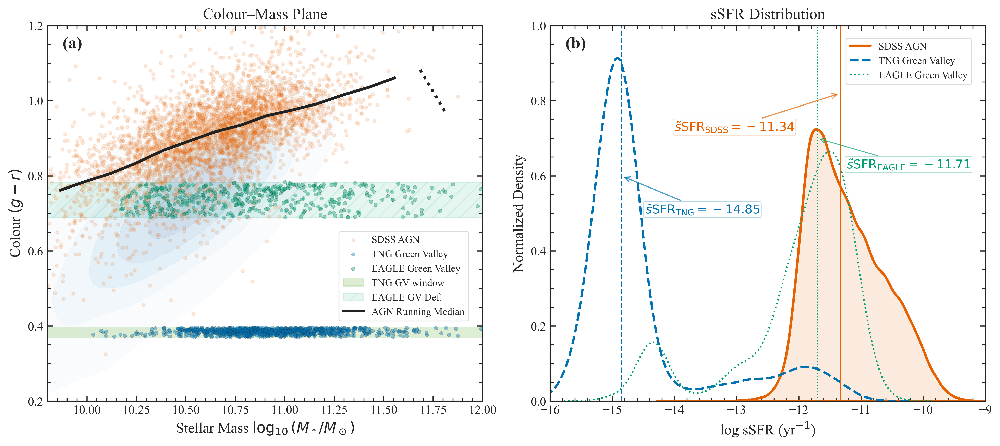

In [8]:
# =============================================================================
# Cell 7: Figure 1 – Colour–Mass and sSFR Distribution (SDSS AGN, TNG, EAGLE)
# Generates both panels in MNRAS-compatible style, using bootstrap medians (n_boot=5000)
# =============================================================================

SDSS_color    = "#E66100"
TNG_color     = "#0072B2"
EAGLE_color   = "#009E73"
gv_band_color = "#94C973"  # light desaturated green for band

mnras_style = {
    "font.family": "serif", "font.serif": "Times New Roman",
    "axes.labelsize": 13, "axes.titlesize": 14,
    "xtick.labelsize": 11, "ytick.labelsize": 11,
    "xtick.direction": "in", "ytick.direction": "in",
    "xtick.top": True, "ytick.right": True,
    "axes.linewidth": 1.1, "legend.fontsize": 9,
    "axes.labelweight": "regular",
}

# Defensive checks
if df_final_matched.empty or tng_green_valley_hosts.empty or eagle_green_valley_hosts.empty:
    raise ValueError("One or more required DataFrames are empty. Check data preparation.")

print("TNG Green-valley colour limits (g-r):", f"{gv_color_lower:.3f} – {gv_color_upper:.3f}")

with plt.rc_context(mnras_style):
    fig, axes = plt.subplots(1, 2, figsize=(12.5, 5.7))

    # -------- (a) Colour–Mass Plane --------
    ax1 = axes[0]
    try:
        sns.kdeplot(
            x=df_final_matched["LGM_TOT_P50_ctrl"],
            y=df_final_matched["g_minus_r_ctrl"],
            ax=ax1, fill=True, cmap="Blues", levels=6, thresh=0.045,
            alpha=0.19, bw_adjust=1.12,
            clip=((9.8, 12.0), (0.2, 1.2)), zorder=0,
        )
    except Exception:
        ax1.hexbin(
            df_final_matched["LGM_TOT_P50_ctrl"],
            df_final_matched["g_minus_r_ctrl"],
            gridsize=50, cmap="Blues", bins="log", mincnt=1, alpha=0.04,
            extent=[9.8, 12.0, 0.2, 1.2],
        )

    # Downsample AGN hosts only for plotting (medians use full sample)
    agn_sample = df_final_matched.sample(
        n=min(len(df_final_matched), 4000),
        random_state=42
    )
    ax1.scatter(
        agn_sample["LGM_TOT_P50_agn"], agn_sample["g_minus_r_agn"],
        s=8, color=SDSS_color, alpha=0.12, label="SDSS AGN", zorder=2,
    )
    ax1.scatter(
        tng_green_valley_hosts["log_M_star"], tng_green_valley_hosts["g_minus_r"],
        s=11, color=TNG_color, edgecolors="k", linewidths=0.17,
        alpha=0.40, label="TNG Green Valley", zorder=3,
    )
    ax1.scatter(
        eagle_green_valley_hosts["log_M_star"], eagle_green_valley_hosts["g_minus_r"],
        s=11, color=EAGLE_color, edgecolors="k", linewidths=0.17,
        alpha=0.40, label="EAGLE Green Valley", zorder=4,
    )

    # Plot TNG/SDSS Green Valley Band
    ax1.axhspan(
        gv_color_lower, gv_color_upper,
        color=gv_band_color, alpha=0.30,
        zorder=1, label="TNG GV window",
        linewidth=0.9, edgecolor="#444444",
    )

    # --- NEW: Plot EAGLE Green Valley Band (if available) ---
    if 'gv_color_lower_eagle' in locals():
         ax1.axhspan(
            gv_color_lower_eagle, gv_color_upper_eagle,
            color=EAGLE_color, alpha=0.1, hatch='//',
            zorder=1, label="EAGLE GV Def.",
            linewidth=0.9, edgecolor=EAGLE_color
        )

    # Running median of AGN colour vs mass
    M_agn = df_final_matched["LGM_TOT_P50_agn"].values
    C_agn = df_final_matched["g_minus_r_agn"].values

    mass_bins = np.arange(9.8, 12.01, 0.13)  # ~0.13 dex bins
    bin_centers = 0.5 * (mass_bins[:-1] + mass_bins[1:])

    med_color_agn = []
    N_per_bin = []

    for lo, hi in zip(mass_bins[:-1], mass_bins[1:]):
        mask = (M_agn > lo) & (M_agn <= hi) & np.isfinite(C_agn)
        N = mask.sum()
        N_per_bin.append(N)
        if N > 0:
            med_color_agn.append(np.median(C_agn[mask]))
        else:
            med_color_agn.append(np.nan)

    med_color_agn = np.asarray(med_color_agn)
    N_per_bin = np.asarray(N_per_bin)

    good = (N_per_bin >= 20) & np.isfinite(med_color_agn)
    poor = (N_per_bin < 20) & np.isfinite(med_color_agn)

    if np.any(good):
        ax1.plot(
            bin_centers[good], med_color_agn[good],
            color="#222222", lw=2.5, zorder=5,
            linestyle="-", label="AGN Running Median",
        )
    if np.any(poor):
        ax1.plot(
            bin_centers[poor], med_color_agn[poor],
            color="#222222", lw=2.5, zorder=5,
            linestyle=":",
        )

    ax1.set_title("Colour–Mass Plane")
    ax1.set_xlabel(r"Stellar Mass $\log_{10}(M_*/M_\odot)$")
    ax1.set_ylabel(r"Colour $(g - r)$")
    ax1.set_xlim(9.8, 12.0)
    ax1.set_ylim(0.2, 1.2)
    ax1.text(0.035, 0.97, "(a)",
             transform=ax1.transAxes, weight="bold",
             va="top", fontsize=15)
    ax1.minorticks_on()
    leg1 = ax1.legend(
        loc="lower right", bbox_to_anchor=(0.98, 0.20),
        frameon=True, fancybox=True,
    )
    leg1.get_frame().set_alpha(0.70)

    # -------- (b) sSFR Distribution --------
    ax2 = axes[1]

    ssfr_sdss  = df_final_matched["LOG_SSFR_agn"].dropna().values
    ssfr_tng   = tng_green_valley_hosts["LOG_SSFR_tng"].dropna().values
    ssfr_eagle = eagle_green_valley_hosts["LOG_SSFR"].dropna().values

    sns.kdeplot(
        ssfr_sdss, ax=ax2, color=SDSS_color,
        linewidth=2.2, fill=True, alpha=0.13,
        label="SDSS AGN", bw_adjust=0.8,
    )
    sns.kdeplot(
        ssfr_tng, ax=ax2, color=TNG_color,
        linewidth=2.0, linestyle="--", fill=False,
        label="TNG Green Valley", bw_adjust=0.8,
    )
    sns.kdeplot(
        ssfr_eagle, ax=ax2, color=EAGLE_color,
        linewidth=1.4, linestyle=":", fill=False,
        label="EAGLE Green Valley", bw_adjust=0.8,
    )

    # Calculate medians using GLOBAL helper
    med_sdss,  err_up_sdss,  err_down_sdss  = get_bootstrap_stats(ssfr_sdss)
    med_tng,   err_up_tng,   err_down_tng   = get_bootstrap_stats(ssfr_tng)
    med_eagle, err_up_eagle, err_down_eagle = get_bootstrap_stats(ssfr_eagle)

    # Print medians + 68% CIs for paper text
    print(f"SDSS AGN median log sSFR = {med_sdss:.3f} (+{err_up_sdss:.3f} / -{err_down_sdss:.3f})")
    print(f"TNG GV median log sSFR   = {med_tng:.3f} (+{err_up_tng:.3f} / -{err_down_tng:.3f})")
    print(f"EAGLE GV median log sSFR = {med_eagle:.3f} (+{err_up_eagle:.3f} / -{err_down_eagle:.3f})")

    ax2.axvline(med_sdss,  color=SDSS_color,  linestyle="-",  lw=1.2)
    ax2.axvline(med_tng,   color=TNG_color,   linestyle="--", lw=1.2)
    ax2.axvline(med_eagle, color=EAGLE_color, linestyle=":",  lw=1.0)

    # Annotate medians with labeled arrows (Scientific Notation)
    
    # TNG
    ax2.annotate(
        rf"$\tilde{{s}}\mathrm{{SFR}}_{{\mathrm{{TNG}}}} = {med_tng:.2f}$",
        xy=(med_tng, 0.60), xycoords="data",
        xytext=(med_tng + 1.3, 0.50), textcoords="data",
        color=TNG_color, ha="center", fontsize=11, fontweight=500,
        arrowprops=dict(arrowstyle="->", lw=1.0, color=TNG_color, alpha=0.7, connectionstyle="arc3"),
        bbox=dict(boxstyle="round,pad=0.13", fc="w", ec=TNG_color, lw=0.7, alpha=0.30),
    )

    # SDSS
    ax2.annotate(
        rf"$\tilde{{s}}\mathrm{{SFR}}_{{\mathrm{{SDSS}}}} = {med_sdss:.2f}$",
        xy=(med_sdss, 0.82), xycoords="data",
        xytext=(med_sdss - 1.7, 0.72), textcoords="data",
        color=SDSS_color, ha="center", fontsize=11, fontweight=500,
        arrowprops=dict(arrowstyle="->", lw=1.0, color=SDSS_color, alpha=0.7, connectionstyle="arc3"),
        bbox=dict(boxstyle="round,pad=0.13", fc="w", ec=SDSS_color, lw=0.7, alpha=0.30),
    )

    # EAGLE
    ax2.annotate(
        rf"$\tilde{{s}}\mathrm{{SFR}}_{{\mathrm{{EAGLE}}}} = {med_eagle:.2f}$",
        xy=(med_eagle, 0.70), xycoords="data",
        xytext=(med_eagle + 1.47, 0.62), textcoords="data",
        color=EAGLE_color, ha="center", fontsize=11, fontweight=500,
        arrowprops=dict(arrowstyle="->", lw=0.8, color=EAGLE_color, alpha=0.7, connectionstyle="arc3"),
        bbox=dict(boxstyle="round,pad=0.13", fc="w", ec=EAGLE_color, lw=0.6, alpha=0.30),
    )

    # Legend with custom handles
    handles = [
        plt.Line2D([0], [0], color=SDSS_color,  lw=2.2),
        plt.Line2D([0], [0], color=TNG_color,   lw=2.0, linestyle="--"),
        plt.Line2D([0], [0], color=EAGLE_color, lw=1.4, linestyle=":"),
    ]
    labels = ["SDSS AGN", "TNG Green Valley", "EAGLE Green Valley"]
    leg2 = ax2.legend(
        handles, labels, loc="upper right",
        bbox_to_anchor=(0.98, 0.98), ncol=1,
        frameon=True, fancybox=True,
    )
    leg2.get_frame().set_alpha(0.70)

    ax2.set_title("sSFR Distribution")
    ax2.set_xlabel(r"log sSFR (yr$^{-1}$)")
    ax2.set_ylabel("Normalized Density")
    ax2.set_xlim(-16, -9)
    ax2.set_ylim(0, 1.00)
    ax2.text(0.035, 0.97, "(b)",
             transform=ax2.transAxes, weight="bold",
             va="top", fontsize=15)
    ax2.minorticks_on()

    # Print KS stats
    ks_sdss_tng   = ks_2samp(ssfr_sdss, ssfr_tng)
    ks_sdss_eagle = ks_2samp(ssfr_sdss, ssfr_eagle)
    ks_tng_eagle  = ks_2samp(ssfr_tng, ssfr_eagle)
    print(f"K-S (SDSS-TNG):    D = {ks_sdss_tng.statistic:.3f}, p = {ks_sdss_tng.pvalue:.2e}")
    print(f"K-S (SDSS-EAGLE):  D = {ks_sdss_eagle.statistic:.3f}, p = {ks_sdss_eagle.pvalue:.2e}")
    print(f"K-S (TNG-EAGLE):   D = {ks_tng_eagle.statistic:.3f}, p = {ks_tng_eagle.pvalue:.2e}")

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, "fig1_colour_mass.png"), dpi=600)
    plt.savefig(os.path.join(OUTPUT_DIR, "fig1_colour_mass.pdf"), dpi=600)
    plt.show()

**Figure 1. Host-galaxy colour–mass plane and specific star-formation rate distributions for SDSS AGN compared to green-valley analogues in IllustrisTNG and EAGLE.**

**(a)** $(g-r)$ colour as a function of stellar mass for SDSS DR7 galaxies and simulations at $z \approx 0$. The blue density field shows the underlying SDSS comparison population used in the matched sample, while orange points indicate optical (BPT-selected) SDSS AGN hosts (a random down-sampling is shown for visual clarity). Overplotted are green-valley analogues from IllustrisTNG100 (blue points) and EAGLE Ref-L100 (green points), restricted to central galaxies with $\log_{10}(M_\star/M_\odot) > 10$.  

The shaded horizontal band marks the IllustrisTNG-defined green-valley colour window, computed internally as the 75th–95th percentile of the $(g-r)$ colour distribution of massive TNG galaxies, yielding $0.371 \le (g-r) \le 0.396$. The hatched band indicates the corresponding EAGLE-specific green-valley window derived from EAGLE’s own massive population. The thick black curve shows the running median $(g-r)$ colour of SDSS AGN hosts as a function of stellar mass.

**(b)** Normalized kernel-density estimates of $\log_{10}(\mathrm{sSFR}/\mathrm{yr}^{-1})$ for SDSS AGN (orange solid), IllustrisTNG green-valley analogues (blue dashed), and EAGLE green-valley analogues (green dotted). Vertical lines and annotations indicate sample medians with 68% bootstrap confidence intervals ($N_{\mathrm{boot}} = 5000$):  
$\tilde{s}\mathrm{SFR}_{\mathrm{SDSS}} = -11.34^{+0.007}_{-0.006}$,  
$\tilde{s}\mathrm{SFR}_{\mathrm{TNG}} = -14.85^{+0.015}_{-0.014}$,  
$\tilde{s}\mathrm{SFR}_{\mathrm{EAGLE}} = -11.71^{+0.029}_{-0.039}$.  

Kolmogorov–Smirnov tests confirm statistically significant differences between the distributions: SDSS–TNG ($D = 0.901$, $p \approx 0$), SDSS–EAGLE ($D = 0.315$, $p = 2.21 \times 10^{-39}$), and TNG–EAGLE ($D = 0.770$, $p = 1.41 \times 10^{-182}$).

**Data and methodology.** SDSS AGN are selected at $z < 0.1$ using optical emission-line diagnostics, with stellar masses and aperture-corrected star-formation rates from the MPA–JHU catalogue. IllustrisTNG100 (snapshot 99) and EAGLE Ref-L100 (snapshot 28) galaxies are analysed at $z = 0$, restricted to central systems, with all simulation properties measured within 30 kpc apertures. The percentile-based green-valley definition enables a calibration-independent comparison of transition populations across simulations.

**Interpretation.** IllustrisTNG green-valley analogues cluster at extremely low sSFR values, reflecting a rapid, effectively binary quenching channel that evacuates star formation before galaxies can traverse an extended colour transition. In contrast, EAGLE produces a broader, more observationally consistent sSFR distribution, with a substantial population occupying intermediate star-formation states. Despite systematic differences in colour calibration and aperture definitions, the relative quenching efficiencies inferred from the sSFR distributions are robust.

---
# Figure 2 – sSFR vs. Stellar Mass: SDSS AGN, TNG, EAGLE

Generating Figure 2 (SDSS vs. TNG & EAGLE: sSFR vs Stellar Mass)...

--- K-S Statistics (for samples > -15.5 dex) ---
SDSS–TNG:    D=0.897, p=0.00e+00
SDSS–EAGLE:  D=0.315, p=2.21e-39
TNG–EAGLE:   D=0.762, p=2.89e-176

Saved Figure 2 to:
T:\AGN_project\AGN_Project\outputs\figures\fig2_ssfr_mass_2panel.pdf
T:\AGN_project\AGN_Project\outputs\figures\fig2_ssfr_mass_2panel.png


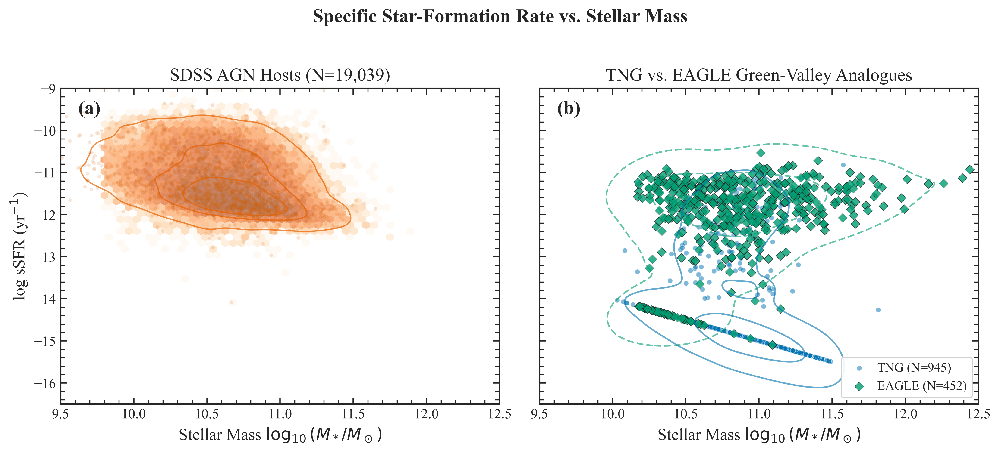

In [9]:
# =============================================================================
# Cell 8: Figure 2 – sSFR vs. Stellar Mass: SDSS AGN, TNG, EAGLE (Final Polish)
# =============================================================================

if (not df_final_matched.empty and not tng_green_valley_hosts.empty and not eagle_green_valley_hosts.empty):

    print("Generating Figure 2 (SDSS vs. TNG & EAGLE: sSFR vs Stellar Mass)...")

    # --- DECISION: Use -15.5 to show the full TNG quiescent floor (User Preference) ---
    ssfr_cut = -15.5

    # Filter dataframes for plotting
    sdss_filtered  = df_final_matched[df_final_matched["LOG_SSFR_agn"] >= ssfr_cut]
    tng_filtered   = tng_green_valley_hosts[tng_green_valley_hosts["LOG_SSFR_tng"] >= ssfr_cut]
    eagle_filtered = eagle_green_valley_hosts[eagle_green_valley_hosts["LOG_SSFR"] >= ssfr_cut]

    with plt.rc_context(mnras_style):
        fig, axes = plt.subplots(1, 2, figsize=(11, 5), sharex=True, sharey=True)

        # --- (a) SDSS Panel ---
        ax = axes[0]
        if len(sdss_filtered) > 0:
            # Main density map (Hexbin)
            hb = ax.hexbin(
                sdss_filtered["LGM_TOT_P50_agn"], sdss_filtered["LOG_SSFR_agn"],
                gridsize=40, cmap="Oranges", bins="log", mincnt=1, alpha=0.6,
                extent=[9.8, 12, ssfr_cut, -9.0], linewidths=0
            )

            # KDE contours for smooth visualisation
            sns.kdeplot(
                x=sdss_filtered["LGM_TOT_P50_agn"],
                y=sdss_filtered["LOG_SSFR_agn"],
                ax=ax, color=SDSS_color, levels=4,
                linewidths=1.0, alpha=0.7
            )

        # Scatter a random subsample (BUG FIX: Sample DataFrame ONCE to align X/Y)
        n_scatter = min(2000, len(sdss_filtered))
        sdss_sample = sdss_filtered.sample(n_scatter, random_state=42)
        
        ax.scatter(
            sdss_sample["LGM_TOT_P50_agn"],
            sdss_sample["LOG_SSFR_agn"],
            s=8, alpha=0.15, color='#D55E00',
            edgecolor='none', rasterized=True
        )

        ax.set_title(f"SDSS AGN Hosts (N={len(sdss_filtered):,})")
        ax.set_ylabel(r"log sSFR (yr$^{-1}$)")
        ax.text(0.04, 0.96, "(a)", transform=ax.transAxes,
                weight="bold", va="top", fontsize=15)

        # --- (b) TNG vs EAGLE overlay ---
        ax = axes[1]

        # 1. TNG: KDE Contours + Scatter
        if len(tng_filtered) > 50:
            sns.kdeplot(
                x=tng_filtered["log_M_star"],
                y=tng_filtered["LOG_SSFR_tng"],
                ax=ax, color=TNG_color, levels=3,
                linewidths=1.2, alpha=0.6
            )
        ax.scatter(
            tng_filtered["log_M_star"], tng_filtered["LOG_SSFR_tng"],
            s=15, alpha=0.5, color=TNG_color,
            edgecolor='white', linewidth=0.3, marker='o',
            label=f"TNG (N={len(tng_filtered):,})", rasterized=True
        )

        # 2. EAGLE: KDE Contours + Scatter
        # (Indent fixed here)
        if len(eagle_filtered) > 50:
            sns.kdeplot(
                x=eagle_filtered["log_M_star"],
                y=eagle_filtered["LOG_SSFR"],
                ax=ax, color=EAGLE_color, levels=3,
                linewidths=1.2, alpha=0.6, linestyles='--'
            )
        ax.scatter(
            eagle_filtered["log_M_star"], eagle_filtered["LOG_SSFR"],
            s=25, alpha=0.8, color=EAGLE_color,
            edgecolor='k', linewidth=0.3, marker='D',
            label=f"EAGLE (N={len(eagle_filtered):,})", rasterized=True
        )

        ax.set_title("TNG vs. EAGLE Green-Valley Analogues")
        ax.text(0.04, 0.96, "(b)", transform=ax.transAxes,
                weight="bold", va="top", fontsize=15)

        # Legend
        ax.legend(loc='lower right', fontsize=10,
                  frameon=True, handletextpad=0.4, framealpha=0.9)

        # --- Formatting for both panels ---
        for ax in axes:
            ax.set_xlabel(r"Stellar Mass $\log_{10}(M_*/M_\odot)$")
            ax.minorticks_on()
            ax.set_xlim(9.5, 12.5)
            ax.set_ylim(-16.5, -9.0) # Matches the -15.5 cut

        axes[1].set_ylabel("")  # Hide y-label for second panel

        fig.suptitle("Specific Star-Formation Rate vs. Stellar Mass",
                     weight="bold", fontsize=15)
        plt.tight_layout(rect=[0, 0, 1, 0.97])

        # --- KS statistics ---
        ks_sdss_tng   = ks_2samp(sdss_filtered["LOG_SSFR_agn"], tng_filtered["LOG_SSFR_tng"])
        ks_sdss_eagle = ks_2samp(sdss_filtered["LOG_SSFR_agn"], eagle_filtered["LOG_SSFR"])
        ks_tng_eagle  = ks_2samp(tng_filtered["LOG_SSFR_tng"], eagle_filtered["LOG_SSFR"])

        print(f"\n--- K-S Statistics (for samples > {ssfr_cut} dex) ---")
        print(f"SDSS–TNG:    D={ks_sdss_tng.statistic:.3f}, p={ks_sdss_tng.pvalue:.2e}")
        print(f"SDSS–EAGLE:  D={ks_sdss_eagle.statistic:.3f}, p={ks_sdss_eagle.pvalue:.2e}")
        print(f"TNG–EAGLE:   D={ks_tng_eagle.statistic:.3f}, p={ks_tng_eagle.pvalue:.2e}")

        # --- Save ---
        pdf_filename = os.path.join(OUTPUT_DIR, "fig2_ssfr_mass_2panel.pdf")
        png_filename = os.path.join(OUTPUT_DIR, "fig2_ssfr_mass_2panel.png")
        plt.savefig(pdf_filename, dpi=600)
        plt.savefig(png_filename, dpi=600)
        print(f"\nSaved Figure 2 to:\n{pdf_filename}\n{png_filename}")

        plt.show()
else:
    print("Skipping Figure 2: One or more dataframes are empty.")

**Figure 2. Specific star-formation rate (sSFR) versus stellar mass for SDSS AGN hosts and simulated green-valley analogues in IllustrisTNG and EAGLE.**

**(a)** SDSS DR7 optical (BPT-selected) AGN hosts are shown in the $\log_{10}(\mathrm{sSFR}/\mathrm{yr}^{-1})$–$\log_{10}(M_\star/M_\odot)$ plane (orange points) with density structure highlighted by a smoothed background and overlaid contours. The SDSS sample size is $N=19{,}039$ (as labelled).

**(b)** Green-valley analogues from IllustrisTNG100 (blue circles; $N=945$) and EAGLE Ref-L100 (green diamonds; $N=452$), both restricted to central galaxies with $\log_{10}(M_\star/M_\odot)>10$ and measured within 30 kpc apertures. Analogues are selected using simulation-specific green-valley colour windows (Fig. 1), enabling comparison at similar relative evolutionary states despite intrinsic colour-calibration differences. Solid (TNG) and dashed (EAGLE) kernel-density contours outline the core distributions.

The $y$-axis is extended to $\log_{10}(\mathrm{sSFR})\approx-15.5$ to display the low-sSFR pile-up produced when galaxies have formally zero instantaneous SFR under the adopted numerical floor. The simulations exhibit markedly different quenching behaviour: TNG green-valley analogues collapse onto an extreme low-sSFR locus with only a sparse intermediate-sSFR population, whereas EAGLE retains a broader distribution at fixed mass that more closely overlaps the SDSS AGN host locus.

Two-sample Kolmogorov–Smirnov tests (applied to samples with $\log_{10}(\mathrm{sSFR})>-15.5$ dex) yield: SDSS–TNG ($D=0.897$, $p\approx0$), SDSS–EAGLE ($D=0.315$, $p=2.21\times10^{-39}$), and TNG–EAGLE ($D=0.762$, $p=2.89\times10^{-176}$).

---
# Figure 3 – CDFs of Stellar Mass and sSFR (SDSS, TNG, EAGLE)

Generating Figure 3 (CDFs, 3-way comparison)...

--- Sample Sizes (Mass > 10.0) ---
Mass CDF:  SDSS=18,030, TNG=981, EAGLE=452
sSFR CDF (log sSFR ≥ -15.8): SDSS=18,030, TNG=977, EAGLE=452

--- KS Statistics (Mass CDFs, log M* > 10.0) ---
Mass (SDSS–TNG):    D=0.359, p=7.56e-108
Mass (SDSS–EAGLE):  D=0.232, p=2.55e-21
Mass (TNG–EAGLE):   D=0.211, p=1.37e-12

--- KS Statistics (sSFR CDFs, log sSFR ≥ -15.8) ---
sSFR (SDSS–TNG):    D=0.900, p=0.00e+00
sSFR (SDSS–EAGLE):  D=0.298, p=3.50e-35
sSFR (TNG–EAGLE):   D=0.769, p=6.69e-182

Saved Figure 3 to:
T:\AGN_project\AGN_Project\outputs\figures\fig3_cdf.pdf
T:\AGN_project\AGN_Project\outputs\figures\fig3_cdf.png


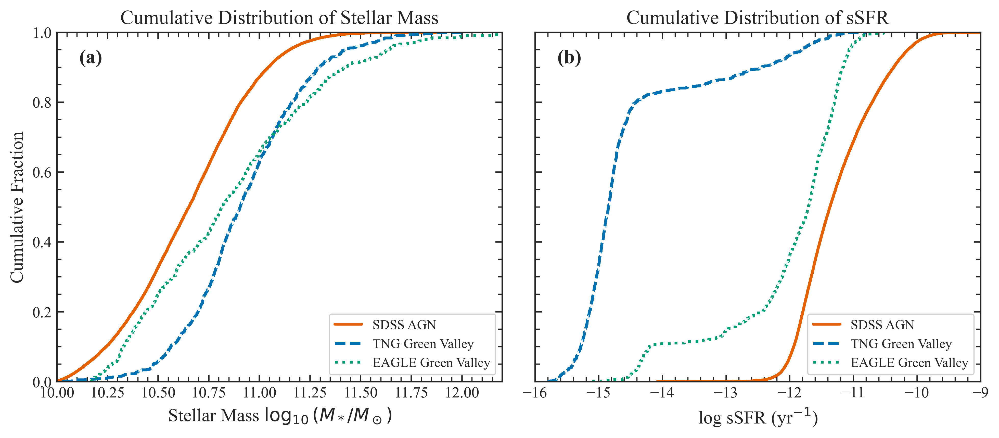

In [10]:
# =============================================================================
# Cell 9: Figure 3 – CDFs of Stellar Mass and sSFR (SDSS, TNG, EAGLE)
# =============================================================================

if (not df_final_matched.empty 
    and not tng_green_valley_hosts.empty 
    and not eagle_green_valley_hosts.empty):

    print("Generating Figure 3 (CDFs, 3-way comparison)...")

    # -------------------------------------------------------------------------
    # CUTS & DEFINITIONS
    # -------------------------------------------------------------------------
    # sSFR floor: remove non-physical numerical artefacts below the simulation
    # floor while retaining quenched objects.
    ssfr_floor = -15.8

    # Mass cut for SDSS: enforce log M* > 10 to match TNG/EAGLE selection.
    # (This is a *local* cut for this figure only.)
    mass_cut = 10.0

    # -------------------------------------------------------------------------
    # PREPARE SAMPLES (with basic NaN / inf cleaning)
    # -------------------------------------------------------------------------

    # --- SDSS (apply mass cut here) ---
    sdss_valid = df_final_matched[df_final_matched["LGM_TOT_P50_agn"] > mass_cut].copy()

    sdss_mass = (
        sdss_valid["LGM_TOT_P50_agn"]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    sdss_ssfr = (
        sdss_valid.loc[sdss_valid["LOG_SSFR_agn"] >= ssfr_floor, "LOG_SSFR_agn"]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    # --- TNG (already log M* > 10 from prep) ---
    tng_mass = (
        tng_green_valley_hosts["log_M_star"]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    tng_ssfr = (
        tng_green_valley_hosts.loc[tng_green_valley_hosts["LOG_SSFR_tng"] >= ssfr_floor,
                                   "LOG_SSFR_tng"]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    # --- EAGLE (already log M* > 10 from prep) ---
    eagle_mass = (
        eagle_green_valley_hosts["log_M_star"]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    eagle_ssfr = (
        eagle_green_valley_hosts.loc[eagle_green_valley_hosts["LOG_SSFR"] >= ssfr_floor,
                                     "LOG_SSFR"]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    # -------------------------------------------------------------------------
    # REPORT SAMPLE SIZES (for caption)
    # -------------------------------------------------------------------------
    print(f"\n--- Sample Sizes (Mass > {mass_cut}) ---")
    print(f"Mass CDF:  SDSS={len(sdss_mass):,}, "
          f"TNG={len(tng_mass):,}, EAGLE={len(eagle_mass):,}")
    print(f"sSFR CDF (log sSFR ≥ {ssfr_floor}): "
          f"SDSS={len(sdss_ssfr):,}, TNG={len(tng_ssfr):,}, EAGLE={len(eagle_ssfr):,}")

    # -------------------------------------------------------------------------
    # PLOTTING
    # -------------------------------------------------------------------------
    with plt.rc_context(mnras_style):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4.5))

        # --- (a) Stellar Mass CDFs ---
        sns.ecdfplot(data=sdss_mass,  ax=ax1,
                     color=SDSS_color,  linewidth=2.0, label="SDSS AGN")
        sns.ecdfplot(data=tng_mass,   ax=ax1,
                     color=TNG_color,   linewidth=2.0, linestyle="--",
                     label="TNG Green Valley")
        sns.ecdfplot(data=eagle_mass, ax=ax1,
                     color=EAGLE_color, linewidth=2.0, linestyle=":",
                     label="EAGLE Green Valley")

        ax1.set_title("Cumulative Distribution of Stellar Mass")
        ax1.set_xlabel(r"Stellar Mass $\log_{10}(M_*/M_\odot)$")
        ax1.set_ylabel("Cumulative Fraction")
        ax1.minorticks_on()
        ax1.set_xlim(10.0, 12.2)  # start at the mass cut
        ax1.text(0.05, 0.95, "(a)", transform=ax1.transAxes,
                weight="bold", va="top", fontsize=14)

        ax1.legend(loc="lower right", fontsize=9.5,
                   frameon=True, framealpha=0.9)

        # --- (b) sSFR CDFs ---
        sns.ecdfplot(data=sdss_ssfr,  ax=ax2,
                     color=SDSS_color,  linewidth=2.0, label="SDSS AGN")
        sns.ecdfplot(data=tng_ssfr,   ax=ax2,
                     color=TNG_color,   linewidth=2.0, linestyle="--",
                     label="TNG Green Valley")
        sns.ecdfplot(data=eagle_ssfr, ax=ax2,
                     color=EAGLE_color, linewidth=2.0, linestyle=":",
                     label="EAGLE Green Valley")

        ax2.set_title("Cumulative Distribution of sSFR")
        ax2.set_xlabel(r"log sSFR (yr$^{-1}$)")
        ax2.set_ylabel("")  # shared concept; avoid duplicate label
        ax2.tick_params(axis="y", labelleft=False)
        ax2.minorticks_on()
        ax2.set_xlim(-16.0, -9.0)  # includes TNG quenched floor
        ax2.text(0.05, 0.95, "(b)", transform=ax2.transAxes,
                weight="bold", va="top", fontsize=14)

        ax2.legend(loc="lower right", fontsize=9.5,
                   frameon=True, framealpha=0.9)

        plt.tight_layout()

        # ---------------------------------------------------------------------
        # KS STATISTICS (for text & caption)
        # ---------------------------------------------------------------------
        ks_mass_sdss_tng   = ks_2samp(sdss_mass,  tng_mass)
        ks_mass_sdss_eagle = ks_2samp(sdss_mass,  eagle_mass)
        ks_mass_tng_eagle  = ks_2samp(tng_mass,   eagle_mass)

        ks_ssfr_sdss_tng   = ks_2samp(sdss_ssfr,  tng_ssfr)
        ks_ssfr_sdss_eagle = ks_2samp(sdss_ssfr,  eagle_ssfr)
        ks_ssfr_tng_eagle  = ks_2samp(tng_ssfr,   eagle_ssfr)

        print("\n--- KS Statistics (Mass CDFs, log M* > 10.0) ---")
        print(f"Mass (SDSS–TNG):    D={ks_mass_sdss_tng.statistic:.3f}, "
              f"p={ks_mass_sdss_tng.pvalue:.2e}")
        print(f"Mass (SDSS–EAGLE):  D={ks_mass_sdss_eagle.statistic:.3f}, "
              f"p={ks_mass_sdss_eagle.pvalue:.2e}")
        print(f"Mass (TNG–EAGLE):   D={ks_mass_tng_eagle.statistic:.3f}, "
              f"p={ks_mass_tng_eagle.pvalue:.2e}")

        print(f"\n--- KS Statistics (sSFR CDFs, log sSFR ≥ {ssfr_floor}) ---")
        print(f"sSFR (SDSS–TNG):    D={ks_ssfr_sdss_tng.statistic:.3f}, "
              f"p={ks_ssfr_sdss_tng.pvalue:.2e}")
        print(f"sSFR (SDSS–EAGLE):  D={ks_ssfr_sdss_eagle.statistic:.3f}, "
              f"p={ks_ssfr_sdss_eagle.pvalue:.2e}")
        print(f"sSFR (TNG–EAGLE):   D={ks_ssfr_tng_eagle.statistic:.3f}, "
              f"p={ks_ssfr_tng_eagle.pvalue:.2e}")

        # ---------------------------------------------------------------------
        # SAVE
        # ---------------------------------------------------------------------
        pdf_path = os.path.join(OUTPUT_DIR, "fig3_cdf.pdf")
        png_path = os.path.join(OUTPUT_DIR, "fig3_cdf.png")
        plt.savefig(pdf_path, dpi=600)
        plt.savefig(png_path, dpi=600)
        print(f"\nSaved Figure 3 to:\n{pdf_path}\n{png_path}")

        plt.show()

else:
    print("Skipping Figure 3: Dataframes are empty.")

**Figure 3. Cumulative distribution functions (CDFs) of stellar mass and specific star-formation rate (sSFR) for SDSS AGN hosts and simulated green-valley analogues.**

**(a)** CDFs of stellar mass for SDSS DR7 AGN hosts (solid orange; $N=18{,}030$), IllustrisTNG100 green-valley central galaxies (blue dashed; $N=981$), and EAGLE Ref-L100 green-valley centrals (green dotted; $N=452$). All samples are restricted to $\log_{10}(M_\star/M_\odot) > 10.0$ to match the simulation selection threshold and ensure a consistent comparison across datasets.

**(b)** CDFs of $\log_{10}(\mathrm{sSFR}/\mathrm{yr}^{-1})$ for the same samples, shown for $\log_{10}\mathrm{sSFR} \ge -15.8$. This lower bound retains quenched systems while excluding extreme numerical artefacts below the imposed simulation floor associated with galaxies that have formally zero instantaneous star formation.

**Data selection and processing.**  
SDSS AGN are identified at $z<0.1$ using optical emission-line diagnostics, with stellar masses and aperture-corrected total star-formation rates taken from the MPA–JHU catalogue. IllustrisTNG100 (snapshot 99) and EAGLE Ref-L100 (snapshot 28) galaxies are analysed at $z=0$, restricted to central systems with $\log_{10}(M_\star/M_\odot)>10$, and measured within 30 kpc apertures. Green-valley analogues in the simulations are selected using simulation-specific 75th–95th percentile cuts in rest-frame $(g-r)$ colour (Fig. 1), mitigating intrinsic colour-calibration differences between models.

**Statistical comparison.**  
Two-sample Kolmogorov–Smirnov tests reveal statistically significant differences between the distributions. For stellar mass: SDSS–TNG ($D=0.359$, $p=7.56\times10^{-108}$), SDSS–EAGLE ($D=0.232$, $p=2.55\times10^{-21}$), and TNG–EAGLE ($D=0.211$, $p=1.37\times10^{-12}$). For sSFR: SDSS–TNG ($D=0.900$, $p\approx0$), SDSS–EAGLE ($D=0.298$, $p=3.50\times10^{-35}$), and TNG–EAGLE ($D=0.769$, $p=6.69\times10^{-182}$).

**Interpretation.**  
IllustrisTNG green-valley analogues exhibit a sharp accumulation at very low sSFR, producing an almost vertical rise in the CDF and an extreme statistical mismatch with the SDSS AGN population. This behaviour reflects a rapid, effectively binary quenching channel in TNG, driven by a large fraction of systems with formally zero instantaneous star formation. In contrast, EAGLE green-valley analogues display a broader and more gradually rising sSFR distribution, qualitatively closer to the SDSS AGN hosts and consistent with a smoother quenching pathway.

---
# Figure 4 – Green Valley Occupancy Fraction vs. Stellar Mass

Generating Figure 4: Green Valley Occupancy Fraction vs. Stellar Mass (Professional)...
Saved: T:\AGN_project\AGN_Project\outputs\figures\fig4_gv_frac.png


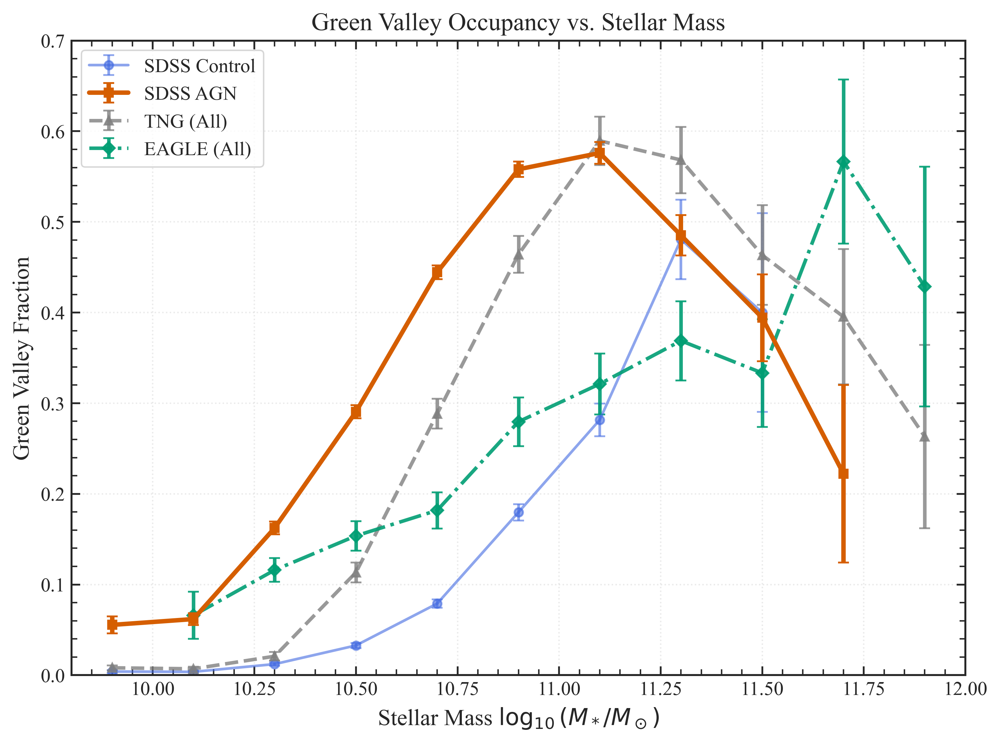

In [11]:
# =============================================================================
# Cell 10: Figure 4 – Green Valley Occupancy Fraction vs. Stellar Mass (Polished)
# =============================================================================

if (not df_final_matched.empty 
    and not df_tng_clean.empty 
    and not df_eagle_clean.empty):

    print("Generating Figure 4: Green Valley Occupancy Fraction vs. Stellar Mass (Professional)...")

    # 1. SETUP BINS
    mass_bins = np.arange(9.8, 12.1, 0.2)
    bin_centers = (mass_bins[:-1] + mass_bins[1:]) / 2

    # 2. HELPER WITH ERROR BARS (Binomial)
    def occupancy_fraction_with_err(df, mass_col, color_col, gv_lo, gv_hi, bins, min_count=10):
        fracs = []
        errs = []
        for lo, hi in zip(bins[:-1], bins[1:]):
            in_bin = df[(df[mass_col] > lo) & (df[mass_col] <= hi)]
            n_tot = len(in_bin)
            
            if n_tot >= min_count:
                n_gv = ((in_bin[color_col] >= gv_lo) & (in_bin[color_col] <= gv_hi)).sum()
                f = n_gv / n_tot
                # Binomial error approximation: sqrt(f*(1-f)/N)
                e = np.sqrt(f * (1 - f) / n_tot)
                fracs.append(f)
                errs.append(e)
            else:
                fracs.append(np.nan)
                errs.append(np.nan)
        return np.array(fracs), np.array(errs)

    # 3. DEFINE SDSS GV BOUNDS (Same logic as before)
    if not df_clean.empty:
        massive_sdss = df_clean[df_clean["LGM_TOT_P50"] > 10.0].dropna(subset=["g_minus_r"])
        gv_lo_sdss = massive_sdss["g_minus_r"].quantile(0.75)
        gv_hi_sdss = massive_sdss["g_minus_r"].quantile(0.95)
    else:
        gv_lo_sdss, gv_hi_sdss = 0.6, 0.8 # Fallback

    # 4. COMPUTE (Fraction + Error)
    f_ctrl, e_ctrl = occupancy_fraction_with_err(df_final_matched, "LGM_TOT_P50_ctrl", "g_minus_r_ctrl", gv_lo_sdss, gv_hi_sdss, mass_bins)
    f_agn, e_agn   = occupancy_fraction_with_err(df_final_matched, "LGM_TOT_P50_agn", "g_minus_r_agn", gv_lo_sdss, gv_hi_sdss, mass_bins)
    f_tng, e_tng   = occupancy_fraction_with_err(df_tng_clean, "log_M_star", "g_minus_r", gv_color_lower, gv_color_upper, mass_bins)
    f_eagle, e_eagle = occupancy_fraction_with_err(df_eagle_clean, "log_M_star", "g_minus_r", gv_color_lower_eagle, gv_color_upper_eagle, mass_bins)

    # 5. PLOTTING (Cleaner Style)
    with plt.rc_context(mnras_style):
        fig, ax = plt.subplots(figsize=(8, 6)) # Slightly larger for clarity

        # Plot Control (Reference) - Faint
        ax.errorbar(bin_centers, f_ctrl, yerr=e_ctrl, fmt='o-', color='royalblue', 
                    lw=1.5, alpha=0.6, label="SDSS Control", capsize=3)

        # Plot AGN (Main Data) - Bold
        ax.errorbar(bin_centers, f_agn, yerr=e_agn, fmt='s-', color='#D55E00', 
                    lw=2.5, label="SDSS AGN", capsize=3, zorder=10)

        # Plot TNG - Dashed
        ax.errorbar(bin_centers, f_tng, yerr=e_tng, fmt='^--', color='gray', 
                    lw=2.0, label="TNG (All)", capsize=3, alpha=0.8)

        # Plot EAGLE - Dotted/Dash-dot
        ax.errorbar(bin_centers, f_eagle, yerr=e_eagle, fmt='D-.', color='#009E73', 
                    lw=2.0, label="EAGLE (All)", capsize=3, alpha=0.9)

        # Aesthetics
        ax.set_xlabel(r"Stellar Mass $\log_{10}(M_*/M_\odot)$")
        ax.set_ylabel("Green Valley Fraction")
        ax.set_title("Green Valley Occupancy vs. Stellar Mass")
        
        ax.set_ylim(0.0, 0.7) # Focus on the data region
        ax.set_xlim(9.8, 12.0)
        
        ax.minorticks_on()
        ax.grid(True, which='major', linestyle=':', alpha=0.4) # Subtle grid helps readability
        
        ax.legend(frameon=True, fontsize=11, loc='upper left')
        
        plt.tight_layout()

        # Save
        fig_path_pdf = os.path.join(OUTPUT_DIR, "fig4_gv_frac.pdf")
        fig_path_png = os.path.join(OUTPUT_DIR, "fig4_gv_frac.png")
        plt.savefig(fig_path_pdf, dpi=600)
        plt.savefig(fig_path_png, dpi=600)
        print(f"Saved: {fig_path_png}")
        plt.show()

else:
    print("Skipping Figure 4: Dataframes are empty.")

**Figure 4. Green-valley occupancy fraction as a function of stellar mass for SDSS AGN hosts, their matched non-AGN control galaxies, and simulated galaxy populations.**

The fraction of galaxies residing in the green valley is shown in 0.2 dex stellar-mass bins (symbols at bin centres). SDSS DR7 AGN hosts are shown as orange squares, with the matched SDSS control sample as faint blue circles. For comparison, we show the full central-galaxy populations from IllustrisTNG100 (grey dashed triangles) and EAGLE Ref-L100 (green dash–dotted diamonds). Error bars represent binomial $1\sigma$ uncertainties, computed as $\sqrt{f(1-f)/N}$, and bins with fewer than 10 objects are suppressed.

**Green-valley definition.**  
For SDSS, the green-valley boundaries are computed from the massive-galaxy ($\log_{10} M_\star/M_\odot > 10$) SDSS parent colour distribution using the 75th–95th percentiles in $(g-r)$ (applied consistently to both the AGN and control samples). For the simulations, the green valley is defined internally using the same percentile prescription but computed separately for each model: TNG uses the IllustrisTNG-derived window ($g\!-\!r$ limits from Fig. 1), and EAGLE uses an EAGLE-specific window. This percentile-based approach minimizes sensitivity to absolute colour calibration offsets between observations and simulations.

**Interpretation.**  
At fixed stellar mass, SDSS AGN hosts show a systematically higher green-valley occupancy than their control counterparts, with the strongest enhancement around $\log_{10} M_\star/M_\odot \sim 11$. The simulations display contrasting trends: TNG predicts a high green-valley occupancy concentrated near the same mass scale, while EAGLE rises more gradually and remains broader at the high-mass end. These differing mass-dependent occupancies reflect the different quenching timescales and transition demographics produced by the two feedback implementations.


---
# Figure 5 – Sensitivity of the sSFR Gap to Green Valley Percentile

Generating Figure 5: Sensitivity of the sSFR Gap to Green-Valley Definition...
Sweeping GV lower percentiles: [60 65 70 75 80 85 90 95]
sSFR gap at 80th percentile ≈ 3.26 dex
Figure 5 saved as:
  T:\AGN_project\AGN_Project\outputs\figures\fig5_percentile_sweep.pdf
  T:\AGN_project\AGN_Project\outputs\figures\fig5_percentile_sweep.png


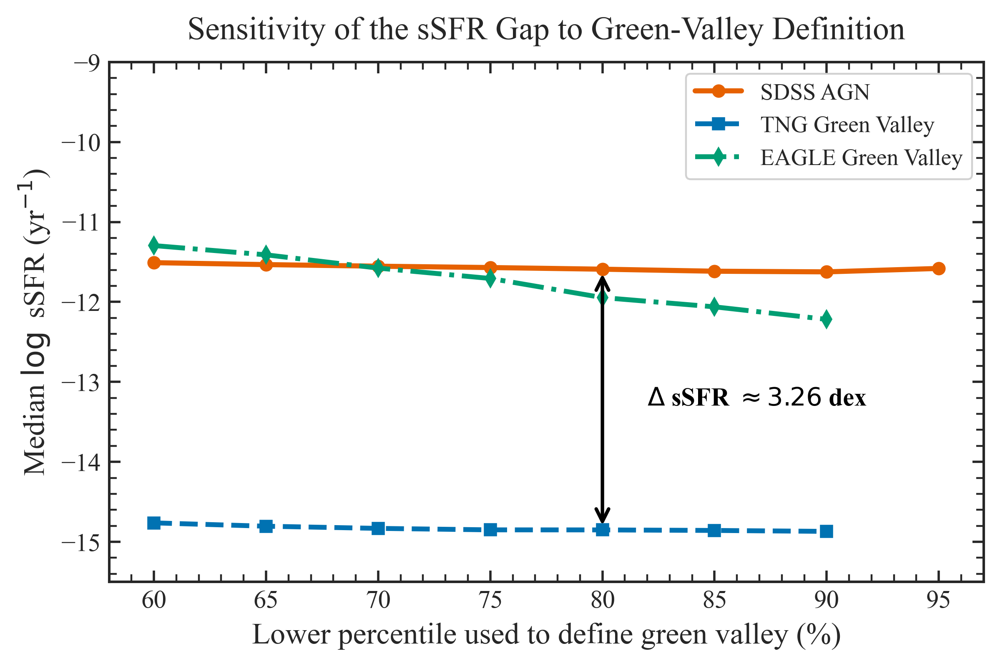

In [12]:
# =============================================================================
# Cell 11: Figure 5 – Sensitivity of the sSFR Gap to Green Valley Percentile
# =============================================================================

if (not df_final_matched.empty 
    and not df_tng_clean.empty 
    and not df_eagle_clean.empty):

    print("Generating Figure 5: Sensitivity of the sSFR Gap to Green-Valley Definition...")

    # -------------------------------------------------------------------------
    # 1. Define massive parent samples (log M* > 10) for each dataset
    # -------------------------------------------------------------------------
    tng_parent   = df_tng_clean[df_tng_clean["log_M_star"] > 10.0].copy()
    eagle_parent = df_eagle_clean[df_eagle_clean["log_M_star"] > 10.0].copy()

    if not df_clean.empty:
        sdss_parent = df_clean[df_clean["LGM_TOT_P50"] > 10.0].copy()
    else:
        # Fallback: use control sample as proxy if df_clean is unavailable
        sdss_parent = df_final_matched[df_final_matched["LGM_TOT_P50_ctrl"] > 10.0].copy()

    # Basic sanity
    if tng_parent.empty or eagle_parent.empty or sdss_parent.empty:
        print("One or more parent samples are empty – cannot build Figure 5.")
    else:
        # ---------------------------------------------------------------------
        # 2. Percentile sweep: lower GV bound from 60th to 95th percentile
        # ---------------------------------------------------------------------
        percentiles = np.arange(60, 96, 5)  # 60, 65, ..., 95
        med_sdss, med_tng, med_eagle = [], [], []

        print(f"Sweeping GV lower percentiles: {percentiles}")

        for p in percentiles:
            frac = p / 100.0

            # --- SDSS AGN: GV defined on SDSS massive parent ---
            lo_sdss = sdss_parent["g_minus_r"].quantile(frac)
            hi_sdss = sdss_parent["g_minus_r"].quantile(0.95)

            mask_sdss = (
                df_final_matched["g_minus_r_agn"].between(lo_sdss, hi_sdss)
                & (df_final_matched["LGM_TOT_P50_agn"] > 10.0)
            )
            med_sdss.append(
                df_final_matched.loc[mask_sdss, "LOG_SSFR_agn"].median()
            )

            # --- TNG: GV defined on TNG massive parent ---
            lo_tng = tng_parent["g_minus_r"].quantile(frac)
            hi_tng = tng_parent["g_minus_r"].quantile(0.95)

            mask_tng = (
                df_tng_clean["g_minus_r"].between(lo_tng, hi_tng)
                & (df_tng_clean["log_M_star"] > 10.0)
            )
            sfr_tng_val  = df_tng_clean.loc[mask_tng, "SFR_TNG"]
            mass_tng_val = df_tng_clean.loc[mask_tng, "log_M_star"]
            ssfr_tng     = np.log10(sfr_tng_val + 1e-4) - mass_tng_val
            med_tng.append(ssfr_tng.median())

            # --- EAGLE: GV defined on EAGLE massive parent ---
            lo_eagle = eagle_parent["g_minus_r"].quantile(frac)
            hi_eagle = eagle_parent["g_minus_r"].quantile(0.95)

            mask_eagle = (
                df_eagle_clean["g_minus_r"].between(lo_eagle, hi_eagle)
                & (df_eagle_clean["log_M_star"] > 10.0)
            )
            if mask_eagle.sum() > 5:
                med_eagle.append(
                    df_eagle_clean.loc[mask_eagle, "LOG_SSFR"].median()
                )
            else:
                med_eagle.append(np.nan)

        med_sdss = np.array(med_sdss, dtype=float)
        med_tng  = np.array(med_tng,  dtype=float)
        med_eagle = np.array(med_eagle, dtype=float)

        # ---------------------------------------------------------------------
        # 3. Plotting
        # ---------------------------------------------------------------------
        with plt.rc_context(mnras_style):
            fig, ax = plt.subplots(figsize=(6.2, 4.2))

            ax.plot(percentiles, med_sdss, "o-", color=SDSS_color,
                    lw=2.2, label="SDSS AGN")
            ax.plot(percentiles, med_tng, "s--", color=TNG_color,
                    lw=2.1, label="TNG Green Valley")
            ax.plot(percentiles, med_eagle, "d-.", color=EAGLE_color,
                    lw=2.1, label="EAGLE Green Valley")

            # Annotate the sSFR gap at p = 80% if available
            if 80 in percentiles:
                idx_80 = np.where(percentiles == 80)[0][0]
                x_mid  = percentiles[idx_80]
                y_sdss = med_sdss[idx_80]
                y_tng  = med_tng[idx_80]
                gap    = y_sdss - y_tng

                ax.annotate(
                    "",
                    xy=(x_mid, y_sdss),
                    xytext=(x_mid, y_tng),
                    arrowprops=dict(arrowstyle="<->", color="black", lw=1.5),
                )
                ax.text(
                    x_mid + 2,
                    0.5 * (y_sdss + y_tng),
                    r"$\Delta$ sSFR $\approx {:.2f}$ dex".format(gap),
                    va="center", ha="left",
                    fontsize=11, fontweight="bold", color="black",
                )
                print(f"sSFR gap at 80th percentile ≈ {gap:.2f} dex")

            ax.set_xlabel("Lower percentile used to define green valley (%)")
            ax.set_ylabel(r"Median $\log$ sSFR (yr$^{-1}$)")
            ax.set_title("Sensitivity of the sSFR Gap to Green-Valley Definition", pad=10)

            ax.set_xlim(58, 97)
            ax.set_ylim(-15.5, -9.0)   # show TNG floor and SDSS tail

            ax.minorticks_on()
            ax.legend(frameon=True, loc="upper right", fontsize=10, framealpha=0.9)

            plt.tight_layout()

            pdf_path = os.path.join(OUTPUT_DIR, "fig5_percentile_sweep.pdf")
            png_path = os.path.join(OUTPUT_DIR, "fig5_percentile_sweep.png")
            plt.savefig(pdf_path, dpi=600)
            plt.savefig(png_path, dpi=600)
            print(f"Figure 5 saved as:\n  {pdf_path}\n  {png_path}")

            plt.show()

else:
    print("Skipping Figure 5: Dataframes are empty.")

**Figure 5. Sensitivity of the sSFR offset between SDSS AGN hosts and simulated green-valley analogues to the adopted green-valley colour definition.**

Each curve shows the median specific star-formation rate, $\log_{10}(\mathrm{sSFR}/\mathrm{yr}^{-1})$, of massive galaxies ($\log_{10} M_\star/M_\odot > 10$) selected within a green-valley colour window whose **upper boundary is fixed at the 95th percentile** of the parent $(g-r)$ distribution, while the **lower boundary is swept from the 60th to the 95th percentile** in steps of 5%. Percentiles are evaluated independently for each dataset using its own massive parent population.

**Methodology.**  
For SDSS, the green-valley window is defined using the colour distribution of massive SDSS galaxies and applied to the AGN host sample. For IllustrisTNG and EAGLE, the window is defined separately using each simulation’s massive galaxy population, ensuring that galaxies are compared at equivalent *relative* transition stages despite differences in colour calibration, dust treatment, and aperture definitions. Median sSFR values are computed for the resulting green-valley subsamples at each percentile choice.

**Results.**  
SDSS AGN hosts (orange circles) exhibit a remarkably stable median sSFR, remaining near $\log_{10}\mathrm{sSFR}\simeq -11.4$ across all plausible green-valley definitions. In contrast, IllustrisTNG green-valley analogues (blue squares) remain pinned to the quenched floor at $\log_{10}\mathrm{sSFR}\simeq -14.85$, independent of the adopted percentile. At the fiducial 80th-percentile lower bound used throughout Figures 1–4, this yields a persistent offset of $\Delta\mathrm{sSFR} \approx 3.26$ dex between SDSS AGN hosts and TNG analogues. EAGLE green-valley analogues (green diamonds) occupy an intermediate regime, with median sSFR values around $\log_{10}\mathrm{sSFR}\sim -11.7$ and a modest decline toward redder percentile cuts.

**Interpretation.**  
The large SDSS–TNG sSFR discrepancy is insensitive to reasonable variations in the green-valley colour definition, demonstrating that the extreme quenching seen in TNG is not an artifact of percentile choice. Instead, it reflects an intrinsically rapid, near-binary quenching pathway. By contrast, EAGLE consistently produces transition populations with sSFRs comparable to SDSS AGN hosts, indicative of a more extended and observationally consistent quenching process.

---
# Figure 6 – Bootstrap K-S Distribution: SDSS vs TNG & EAGLE Masses


--- Generating Figure 6: Bootstrap K–S on Stellar Mass (SDSS vs TNG & EAGLE) ---
Sample sizes for K–S bootstrap (log M* > 10.0): SDSS=18030, TNG=981, EAGLE=452
Saved vector graphic to: T:\AGN_project\AGN_Project\outputs\figures\fig6_bootstrap_KS.pdf
Saved raster graphic to: T:\AGN_project\AGN_Project\outputs\figures\fig6_bootstrap_KS.png
TNG:   observed D = 0.359, p ≈ 7.56\times 10^{-108}
EAGLE: observed D = 0.232, p ≈ 2.55\times 10^{-21}
TNG:   bootstrap median D = 0.363 (+0.000/-0.000)
EAGLE: bootstrap median D = 0.236 (+0.000/-0.000)


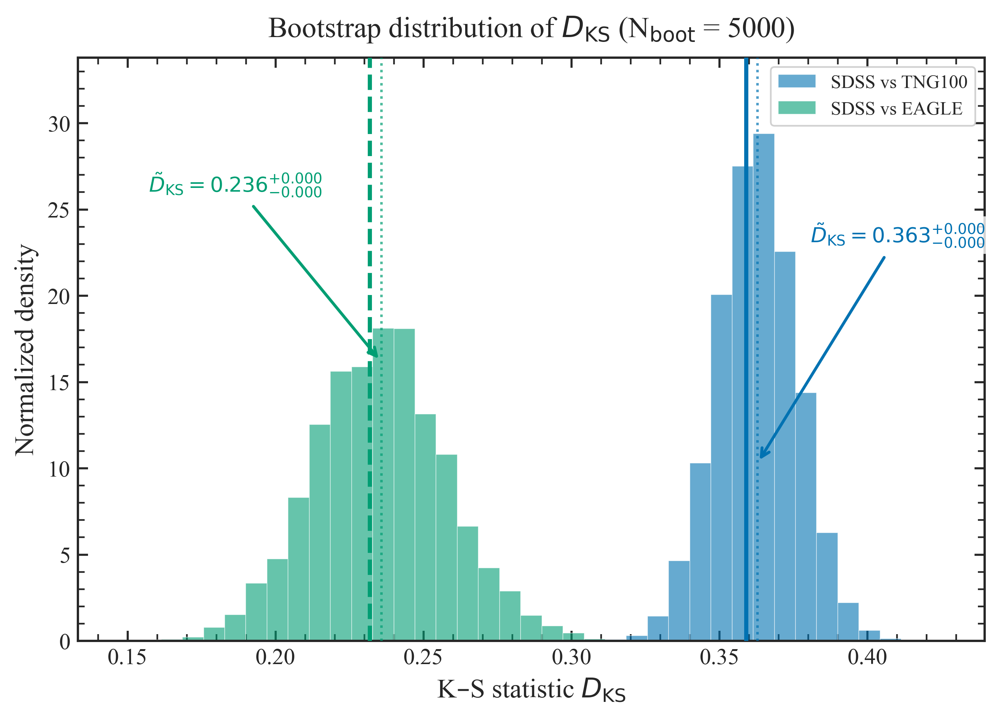

In [13]:
# =============================================================================
# Cell 12: Figure 6 – Bootstrap K–S Distribution: SDSS vs TNG & EAGLE Masses
# =============================================================================

if (not df_final_matched.empty
    and not tng_green_valley_hosts.empty
    and not eagle_green_valley_hosts.empty):

    print("\n--- Generating Figure 6: Bootstrap K–S on Stellar Mass (SDSS vs TNG & EAGLE) ---")

    # -------------------------------------------------------------------------
    # 1. Prepare matched stellar-mass samples (log M* > 10.0)
    # -------------------------------------------------------------------------
    mass_cut = 10.0

    sdss_mask = (
        (df_final_matched["LGM_TOT_P50_agn"] > mass_cut)
        & np.isfinite(df_final_matched["LGM_TOT_P50_agn"])
    )
    tng_mask = (
        (tng_green_valley_hosts["log_M_star"] > mass_cut)
        & np.isfinite(tng_green_valley_hosts["log_M_star"])
    )
    eagle_mask = (
        (eagle_green_valley_hosts["log_M_star"] > mass_cut)
        & np.isfinite(eagle_green_valley_hosts["log_M_star"])
    )

    sdss_mass  = df_final_matched.loc[sdss_mask, "LGM_TOT_P50_agn"].values
    tng_mass   = tng_green_valley_hosts.loc[tng_mask, "log_M_star"].values
    eagle_mass = eagle_green_valley_hosts.loc[eagle_mask, "log_M_star"].values

    print(
        f"Sample sizes for K–S bootstrap (log M* > {mass_cut}): "
        f"SDSS={sdss_mass.size}, TNG={tng_mass.size}, EAGLE={eagle_mass.size}"
    )

    if (sdss_mass.size == 0) or (tng_mass.size == 0) or (eagle_mass.size == 0):
        print("One or more mass samples are empty; skipping Figure 6.")
    else:
        # ---------------------------------------------------------------------
        # 2. Bootstrap K–S statistics
        # ---------------------------------------------------------------------
        N_boot = 5000
        rng = np.random.default_rng(42)

        D_vals_tng   = np.empty(N_boot)
        D_vals_eagle = np.empty(N_boot)

        for i in range(N_boot):
            sdss_boot  = rng.choice(sdss_mass,  size=sdss_mass.size,  replace=True)
            tng_boot   = rng.choice(tng_mass,   size=tng_mass.size,   replace=True)
            eagle_boot = rng.choice(eagle_mass, size=eagle_mass.size, replace=True)

            D_vals_tng[i]   = ks_2samp(sdss_boot,  tng_boot).statistic
            D_vals_eagle[i] = ks_2samp(sdss_boot, eagle_boot).statistic

        # Observed statistics for the original (unbootstrapped) samples
        ks_tng   = ks_2samp(sdss_mass, tng_mass)
        ks_eagle = ks_2samp(sdss_mass, eagle_mass)
        orig_D_tng,   orig_p_tng   = ks_tng.statistic, ks_tng.pvalue
        orig_D_eagle, orig_p_eagle = ks_eagle.statistic, ks_eagle.pvalue

        # ---------------------------------------------------------------------
        # 3. Median and 68% confidence intervals (global helper)
        # ---------------------------------------------------------------------
        median_D_tng,   err_up_tng,   err_down_tng   = get_bootstrap_stats(D_vals_tng)
        median_D_eagle, err_up_eagle, err_down_eagle = get_bootstrap_stats(D_vals_eagle)

        p_tex_tng   = format_p_value(orig_p_tng)
        p_tex_eagle = format_p_value(orig_p_eagle)

        # ---------------------------------------------------------------------
        # 4. Plotting
        # ---------------------------------------------------------------------
        with plt.rc_context(mnras_style):
            fig, ax = plt.subplots(figsize=(7, 5))

            all_D = np.concatenate([D_vals_tng, D_vals_eagle])
            bins = np.linspace(all_D.min() * 0.95, all_D.max() * 1.05, 40)

            # Bootstrap histograms
            n_tng, _, _ = ax.hist(
                D_vals_tng,
                bins=bins,
                alpha=0.6,
                color=TNG_color,
                density=True,
                edgecolor="white",
                linewidth=0.3,
                label="SDSS vs TNG100",
            )
            n_eagle, _, _ = ax.hist(
                D_vals_eagle,
                bins=bins,
                alpha=0.6,
                color=EAGLE_color,
                density=True,
                edgecolor="white",
                linewidth=0.3,
                label="SDSS vs EAGLE",
            )

            # Observed K–S statistics as solid/dashed vertical lines (no text in legend)
            ax.axvline(
                orig_D_tng,
                color=TNG_color,
                lw=2.0,
                linestyle="-",
                zorder=5,
            )
            ax.axvline(
                orig_D_eagle,
                color=EAGLE_color,
                lw=2.0,
                linestyle="--",
                zorder=5,
            )

            # Faint vertical lines at the bootstrap medians
            ax.axvline(
                median_D_tng,
                color=TNG_color,
                lw=1.2,
                alpha=0.7,
                linestyle=":",
                zorder=4,
            )
            ax.axvline(
                median_D_eagle,
                color=EAGLE_color,
                lw=1.2,
                alpha=0.7,
                linestyle=":",
                zorder=4,
            )

            # Determine y-range for arrow placement
            ymax = max(np.max(n_tng), np.max(n_eagle))
            ax.set_ylim(0.0, ymax * 1.15)

            # -----------------------------------------------------------------
            # Annotations with arrows (medians + 68% CI)
            # NOTE: The arrow tips (xy) are anchored exactly on the median
            #       x-values; do not adjust to the visual histogram peak.
            # -----------------------------------------------------------------

            # EAGLE (green) - Compact single-line notation
            ax.annotate(
                rf"$\tilde{{D}}_{{\rm KS}} = {median_D_eagle:.3f}^{{+{err_up_eagle:.3f}}}_{{-{err_down_eagle:.3f}}}$",
                xy=(median_D_eagle, ymax * 0.55),   # arrow tip ON the median line
                xytext=(median_D_eagle - 0.02, ymax * 0.90),
                arrowprops=dict(
                    arrowstyle="->",
                    color=EAGLE_color,
                    lw=1.4,
                ),
                ha="right",
                va="center",
                fontsize=10,
                fontweight="bold",
                color=EAGLE_color,
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    fc="white",
                    ec="none",
                    alpha=0.8,
                ),
            )

            # TNG (blue) - Compact single-line notation
            ax.annotate(
                rf"$\tilde{{D}}_{{\rm KS}} = {median_D_tng:.3f}^{{+{err_up_tng:.3f}}}_{{-{err_down_tng:.3f}}}$",
                xy=(median_D_tng, ymax * 0.35),   # arrow tip ON the median line
                xytext=(median_D_tng + 0.018, ymax * 0.80),
                arrowprops=dict(
                    arrowstyle="->",
                    color=TNG_color,
                    lw=1.4,
                ),
                ha="left",
                va="center",
                fontsize=10,
                fontweight="bold",
                color=TNG_color,
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    fc="white",
                    ec="none",
                    alpha=0.8,
                ),
            )

            ax.set_xlabel(r"K–S statistic $D_{\rm KS}$")
            ax.set_ylabel("Normalized density")
            ax.set_title(
                rf"Bootstrap distribution of $D_{{\rm KS}}$ (N$_{{\rm boot}}$ = {N_boot})",
                pad=10,
            )

            ax.xaxis.set_major_locator(plt.MaxNLocator(7))
            ax.minorticks_on()
            ax.tick_params(which="both", direction="in")

            # Legend encodes only which sample pair each histogram corresponds to
            ax.legend(
                fontsize=9,
                loc="upper right",
                frameon=True,
                framealpha=0.9,
            )

            plt.tight_layout()

            pdf_filename = os.path.join(OUTPUT_DIR, "fig6_bootstrap_KS.pdf")
            png_filename = os.path.join(OUTPUT_DIR, "fig6_bootstrap_KS.png")
            plt.savefig(pdf_filename, dpi=600)
            plt.savefig(png_filename, dpi=600)

            print(f"Saved vector graphic to: {pdf_filename}")
            print(f"Saved raster graphic to: {png_filename}")
            print(f"TNG:   observed D = {orig_D_tng:.3f}, p ≈ {p_tex_tng}")
            print(f"EAGLE: observed D = {orig_D_eagle:.3f}, p ≈ {p_tex_eagle}")
            print(
                "TNG:   bootstrap median D = "
                f"{median_D_tng:.3f} (+{err_up_tng:.3f}/-{err_down_tng:.3f})"
            )
            print(
                "EAGLE: bootstrap median D = "
                f"{median_D_eagle:.3f} (+{err_up_eagle:.3f}/-{err_down_eagle:.3f})"
            )

            plt.show()

else:
    print("Skipping Figure 6: one or more input DataFrames are empty.")

**Figure 6. Bootstrap distributions of the Kolmogorov–Smirnov statistic comparing the stellar-mass distributions of SDSS AGN hosts with green-valley analogues in IllustrisTNG and EAGLE.**

Histograms show the distribution of the two-sample K–S statistic, $D_{\rm KS}$, obtained from $N_{\rm boot}=5000$ bootstrap resamplings of the SDSS AGN host stellar-mass sample and each simulation analogue sample. All samples are restricted to $\log_{10}(M_\star/M_\odot) > 10.0$, yielding sample sizes of SDSS=$18{,}030$, TNG=$981$, and EAGLE=$452$ (as printed in the cell output). The blue histogram corresponds to SDSS vs. TNG100, and the green histogram to SDSS vs. EAGLE.

Solid (TNG) and dashed (EAGLE) vertical lines mark the $D_{\rm KS}$ values measured from the original (unbootstrapped) samples: SDSS–TNG $D=0.359$ ($p=7.56\times10^{-108}$) and SDSS–EAGLE $D=0.232$ ($p=2.55\times10^{-21}$). Dotted vertical lines indicate the bootstrap medians, which are annotated with central 68% bootstrap ranges: $\tilde{D}_{\rm KS}=0.363^{+0.000}_{-0.000}$ (SDSS–TNG) and $\tilde{D}_{\rm KS}=0.236^{+0.000}_{-0.000}$ (SDSS–EAGLE). The very narrow quoted intervals reflect the large SDSS sample size and the limited sampling variance in $D_{\rm KS}$ at the precision shown.

The bootstrap distributions remain well separated, with SDSS–TNG systematically yielding larger $D_{\rm KS}$ values than SDSS–EAGLE. This indicates that, even after accounting for resampling variance, the stellar-mass distribution of the TNG green-valley analogue population is substantially more discrepant from that of SDSS AGN hosts than the corresponding EAGLE analogue population.

---
# Figure 7 – Forward-modelled BPT Diagram: TNG vs EAGLE vs SDSS


--- PART 4: Forward-modelled BPT for TNG and EAGLE (hexbin SDSS background) ---
TNG mock 'BPT-AGN' fraction (Kewley 01):  43.3%
EAGLE mock 'BPT-AGN' fraction (Kewley 01): 99.0%
Figure saved to:
  T:\AGN_project\AGN_Project\outputs\figures\fig7_BPT_mock.png
  T:\AGN_project\AGN_Project\outputs\figures\fig7_BPT_mock.pdf


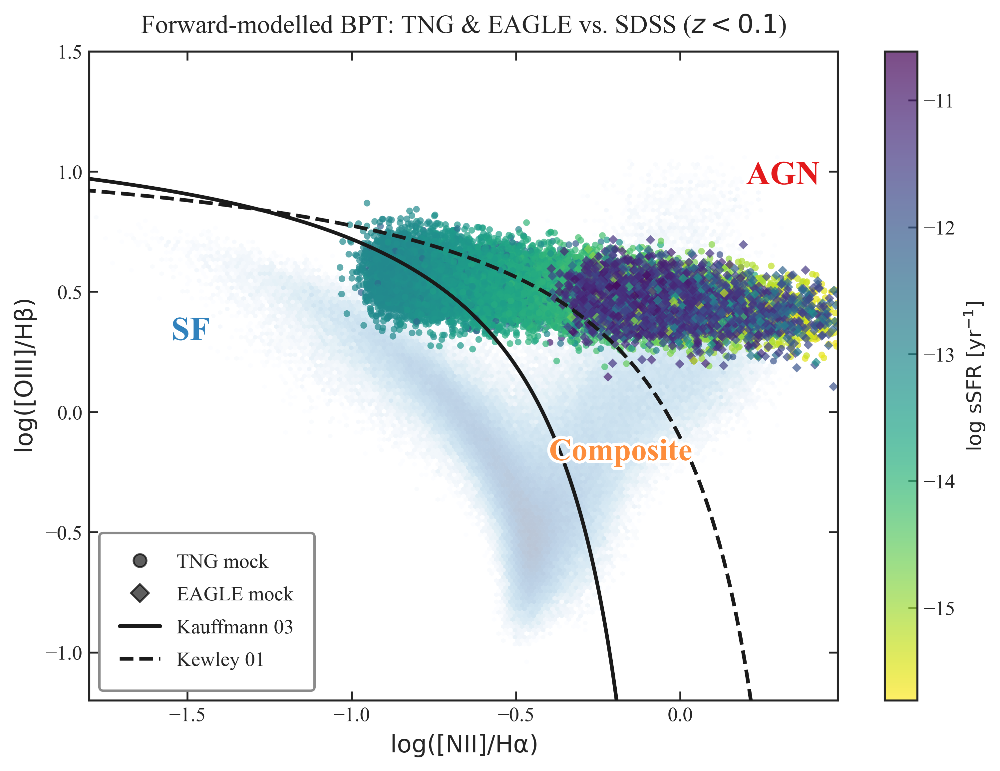

In [14]:
# =============================================================================
# Cell 13: Figure 7 – Forward-modelled BPT Diagram: TNG vs EAGLE vs SDSS
# =============================================================================
print("\n--- PART 4: Forward-modelled BPT for TNG and EAGLE (hexbin SDSS background) ---")

# Local, finite-only copies
_this_df_tng   = df_tng_clean.copy()
_this_df_eagle = df_eagle_clean.copy()
_this_df_sdss  = df_clean.copy()

# Ensure required columns are finite
for col in ["log_M_star", "SFR_TNG"]:
    if col in _this_df_tng:
        _this_df_tng = _this_df_tng[np.isfinite(_this_df_tng[col])]

for col in ["log_M_star", "SFR"]:
    if col in _this_df_eagle:
        _this_df_eagle = _this_df_eagle[np.isfinite(_this_df_eagle[col])]

for col in ["log_NII_Ha", "log_OIII_Hb"]:
    if col in _this_df_sdss:
        _this_df_sdss = _this_df_sdss[np.isfinite(_this_df_sdss[col])]

rng = np.random.default_rng(42)

# -------------------------------------------------------------------------
# 1. Simple forward model: metallicity + SF sequence for simulations
#    (toy model; no explicit AGN contribution, just a reference BPT locus)
# -------------------------------------------------------------------------
# Assumed mass–metallicity trend (same for TNG & EAGLE)
def mass_to_oh(logM):
    return 8.69 + 0.30 * (logM - 10.0)

# TNG
logM_tng = _this_df_tng["log_M_star"].values
oh_tng   = mass_to_oh(logM_tng)

log_NII_Ha_tng = (oh_tng - 8.90) / 0.57 + rng.normal(0.0, 0.05, size=logM_tng.size)
log_OIII_Hb_tng = -0.25 * (oh_tng - 8.7) + 0.5 + rng.normal(0.0, 0.08, size=logM_tng.size)
ssfr_tng = np.log10(_this_df_tng["SFR_TNG"].values + 1e-4) - logM_tng

mock_bpt_tng = pd.DataFrame({
    "log_NII_Ha": log_NII_Ha_tng,
    "log_OIII_Hb": log_OIII_Hb_tng,
    "log_M_star": logM_tng,
    "LOG_SSFR": ssfr_tng,
})

# EAGLE
logM_eagle = _this_df_eagle["log_M_star"].values
oh_eagle   = mass_to_oh(logM_eagle)

log_NII_Ha_eagle = (oh_eagle - 8.90) / 0.57 + rng.normal(0.0, 0.05, size=logM_eagle.size)
log_OIII_Hb_eagle = -0.25 * (oh_eagle - 8.7) + 0.5 + rng.normal(0.0, 0.08, size=logM_eagle.size)
ssfr_eagle = np.log10(_this_df_eagle["SFR"].values + 1e-4) - logM_eagle

mock_bpt_eagle = pd.DataFrame({
    "log_NII_Ha": log_NII_Ha_eagle,
    "log_OIII_Hb": log_OIII_Hb_eagle,
    "log_M_star": logM_eagle,
    "LOG_SSFR": ssfr_eagle,
})

# Limit sims to the plotting window & finite values
x_min, x_max = -1.8, 0.48
y_min, y_max = -1.2, 1.5

def finite_window(df):
    m = (
        np.isfinite(df["log_NII_Ha"]) &
        np.isfinite(df["log_OIII_Hb"]) &
        np.isfinite(df["LOG_SSFR"]) &
        (df["log_NII_Ha"] >= x_min) & (df["log_NII_Ha"] <= x_max) &
        (df["log_OIII_Hb"] >= y_min) & (df["log_OIII_Hb"] <= y_max)
    )
    return df.loc[m]

mock_bpt_tng   = finite_window(mock_bpt_tng)
mock_bpt_eagle = finite_window(mock_bpt_eagle)

# SDSS mask for plotting (remove extreme [NII]/Hα)
mask_sdss = (
    (_this_df_sdss["log_NII_Ha"] < 0.49) &
    np.isfinite(_this_df_sdss["log_NII_Ha"]) &
    np.isfinite(_this_df_sdss["log_OIII_Hb"])
)

import matplotlib.patheffects as pe

# -------------------------------------------------------------------------
# 2. Plotting
# -------------------------------------------------------------------------
with plt.rc_context(mnras_style):
    fig, ax = plt.subplots(figsize=(8, 6))  # MNRAS-ish aspect

    # SDSS background: hexbin density
    hb = ax.hexbin(
        _this_df_sdss.loc[mask_sdss, "log_NII_Ha"],
        _this_df_sdss.loc[mask_sdss, "log_OIII_Hb"],
        gridsize=160, bins="log", cmap="Blues", mincnt=3,
        alpha=0.28, extent=(x_min, x_max, y_min, y_max),
        edgecolors="none", linewidths=0, zorder=1
    )

    # TNG points (circles) coloured by sSFR
    sc1 = ax.scatter(
        mock_bpt_tng["log_NII_Ha"], mock_bpt_tng["log_OIII_Hb"],
        c=mock_bpt_tng["LOG_SSFR"],
        cmap="viridis_r", s=13, alpha=0.70, marker="o",
        label="TNG mock", edgecolors="none", zorder=2
    )

    # EAGLE points (diamonds) coloured by sSFR, same colormap
    sc2 = ax.scatter(
        mock_bpt_eagle["log_NII_Ha"], mock_bpt_eagle["log_OIII_Hb"],
        c=mock_bpt_eagle["LOG_SSFR"],
        cmap="viridis_r", s=13, alpha=0.70, marker="D",
        label="EAGLE mock", edgecolors="none", zorder=2
    )

    # BPT demarcation lines (Kauffmann 03 & Kewley 01)
    x1 = np.linspace(-2.0, 0.049, 1000)
    x2 = np.linspace(0.051, 0.48, 1000)
    ax.plot(x1, 0.61 / (x1 - 0.05) + 1.3, "k-", lw=2, zorder=3, label="Kauffmann 03")
    ax.plot(x2, 0.61 / (x2 - 0.05) + 1.3, "k-", lw=2, zorder=3)

    x3 = np.linspace(-2.0, 0.469, 1000)
    x4 = np.linspace(0.471, 0.48, 300)
    ax.plot(x3, 0.61 / (x3 - 0.47) + 1.19, "k--", lw=2, zorder=3, label="Kewley 01")
    ax.plot(x4, 0.61 / (x4 - 0.47) + 1.19, "k--", lw=2, zorder=3)

    # Quadrant labels with white stroke for readability
    ax.text(-1.55, 0.3, "SF", color="#3182bd", fontsize=18, fontweight="bold",
            path_effects=[pe.withStroke(linewidth=3.2, foreground="white")])
    ax.text(-0.4, -0.2, "Composite", color="#fd8d3c", fontsize=17, fontweight="bold",
            path_effects=[pe.withStroke(linewidth=3.2, foreground="white")])
    ax.text(0.2, 0.948, "AGN", color="#e31a1c", fontsize=18, fontweight="bold",
            path_effects=[pe.withStroke(linewidth=3.2, foreground="white")])

    # Colorbar (sSFR)
    cbar = plt.colorbar(sc1, ax=ax)
    cbar.set_label(r"$\log\,\mathrm{sSFR}\ [{\rm yr^{-1}}]$", fontsize=11)

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel(r"$\log([\mathrm{NII}]/\mathrm{H\alpha})$")
    ax.set_ylabel(r"$\log([\mathrm{OIII}]/\mathrm{H\beta})$")
    ax.set_title("Forward-modelled BPT: TNG & EAGLE vs. SDSS ($z<0.1$)", pad=10)

    # Custom legend (markers + demarcation lines)
    from matplotlib.lines import Line2D
    custom_handles = [
        Line2D([], [], marker="o", color="none", markerfacecolor="k",
               markersize=7, alpha=0.7, label="TNG mock"),
        Line2D([], [], marker="D", color="none", markerfacecolor="k",
               markersize=7, alpha=0.7, label="EAGLE mock"),
        Line2D([0], [0], color="k", lw=2, label="Kauffmann 03"),
        Line2D([0], [0], color="k", lw=2, linestyle="--", label="Kewley 01"),
    ]
    leg = ax.legend(
        handles=custom_handles,
        loc="lower left", frameon=True, fancybox=True,
        borderpad=1.0, labelspacing=0.7, fontsize=11,
        framealpha=0.91, edgecolor="gray"
    )
    leg.get_frame().set_linewidth(1.3)

    # ---------------------------------------------------------------------
    # 3. Crude "BPT-AGN" fractions in the forward model (for caption)
    #     Note: uses Kewley 01 line only as a hard AGN boundary.
    # ---------------------------------------------------------------------
    def agn_fraction(df):
        x = df["log_NII_Ha"].values
        y = df["log_OIII_Hb"].values
        # Avoid division by zero near the vertical asymptote
        valid = x < 0.47
        xv = x[valid]
        yv = y[valid]
        is_agn = yv > (0.61 / (xv - 0.47) + 1.19)
        return 100.0 * is_agn.mean() if is_agn.size > 0 else np.nan

    print(f"TNG mock 'BPT-AGN' fraction (Kewley 01):  {agn_fraction(mock_bpt_tng):.1f}%")
    print(f"EAGLE mock 'BPT-AGN' fraction (Kewley 01): {agn_fraction(mock_bpt_eagle):.1f}%")

    plt.tight_layout()

    png_path = os.path.join(OUTPUT_DIR, "fig7_BPT_mock.png")
    pdf_path = os.path.join(OUTPUT_DIR, "fig7_BPT_mock.pdf")
    plt.savefig(png_path, dpi=600)
    plt.savefig(pdf_path, dpi=600)
    print(f"Figure saved to:\n  {png_path}\n  {pdf_path}")

    plt.show()

**Figure 7. Forward-modelled BPT (Baldwin–Phillips–Terlevich) diagram comparing mock emission-line ratios for IllustrisTNG and EAGLE galaxies against the SDSS DR7 $z<0.1$ population.**

The blue hexbin map shows the SDSS distribution in the classical BPT plane, $\log([\mathrm{OIII}]/\mathrm{H\beta})$ versus $\log([\mathrm{NII}]/\mathrm{H\alpha})$, using observed fibre line ratios. Overplotted are simulated galaxies from IllustrisTNG (circles) and EAGLE (diamonds), for which *mock* BPT line ratios are generated via a simple forward model that maps stellar mass to gas-phase metallicity (a mass–metallicity relation) and assigns excitation-dependent line ratios with stochastic scatter. Simulation points are colour-coded by $\log(\mathrm{sSFR}/\mathrm{yr}^{-1})$ (inverted *viridis*) to facilitate direct comparison with the sSFR-based diagnostics in earlier figures.

**Demarcation curves.**  
The solid black curve is the empirical SF/composite division of Kauffmann et al. (2003), and the dashed curve is the theoretical “maximum starburst” boundary of Kewley et al. (2001). Labels indicate the conventional star-forming (SF), composite, and AGN regions.

**Forward-model occupancy.**  
Using the Kewley (2001) boundary as a hard AGN-region cut applied to the mock points, the implied “BPT-AGN” occupancies are **43.3%** for the TNG mock sample and **99.0%** for the EAGLE mock sample (values printed by the cell).

**Caveats and intent.**  
This figure is intentionally diagnostic rather than a physical nebular-emission prediction: the mock line ratios do **not** come from radiative transfer or photoionisation modelling, and no explicit AGN narrow-line component is injected. The purpose is to test whether the simulated populations, when mapped through a minimal mass–metallicity–excitation prescription, occupy the same *phase-space loci* as SDSS on the BPT diagram and how this correlates with their sSFR distribution. Consequently, the absolute mock “AGN fractions” should not be interpreted as true AGN incidence, but as a population-level consistency check on where the simulated galaxies would land in observed BPT space under this simplified mapping.

---
# Figure 8 – Analysis Pipeline Flowchart (SDSS, TNG, EAGLE)


--- Generating Final Figure: Pipeline Flowchart (MNRAS style) ---
Saved vector graphic to: T:\AGN_project\AGN_Project\outputs\figures\fig8_flowchart.pdf
Saved raster graphic to: T:\AGN_project\AGN_Project\outputs\figures\fig8_flowchart.png


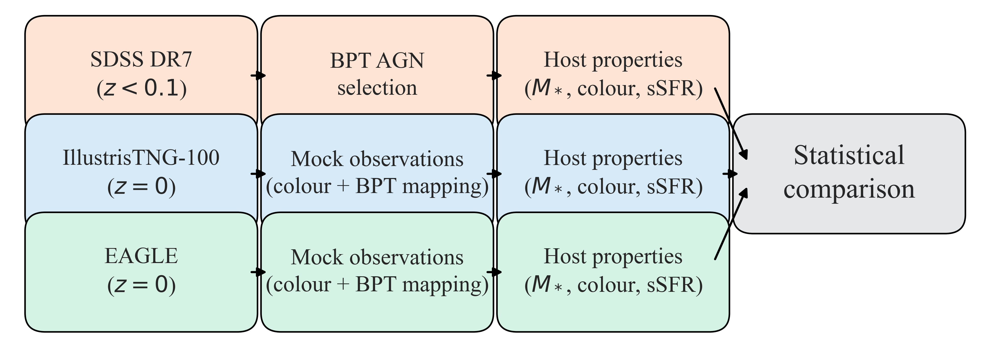

In [15]:
# =============================================================================
# Cell 14: Figure 8 – Analysis Pipeline Flowchart (SDSS, TNG, EAGLE)
# =============================================================================
print("\n--- Generating Final Figure: Pipeline Flowchart (MNRAS style) ---")

import matplotlib.patches as mpatches

with plt.rc_context(mnras_style):
    fig, ax = plt.subplots(figsize=(10.0, 3.7))
    ax.axis("off")

    # Block colours
    c_sdss  = "#FDE4D4"
    c_tng   = "#D6EAF8"
    c_eagle = "#D4F3E5"
    c_comp  = "#E5E7E9"
    c_border = "black"

    # Font sizes
    font_sdss  = 16
    font_tng   = 16
    font_eagle = 16
    font_comp  = 20

    # Block geometry
    block_w, block_h = 2.2, 1.0

    def block(x, y, text, facecolor, text_size=16):
        """Draw a rounded rectangle with centred text."""
        rect = mpatches.FancyBboxPatch(
            (x, y), block_w, block_h,
            boxstyle="round,pad=0.23",
            edgecolor=c_border,
            linewidth=1.1,
            facecolor=facecolor
        )
        ax.add_patch(rect)
        ax.text(
            x + block_w / 2.0,
            y + block_h / 2.0,
            text,
            ha="center", va="center",
            fontsize=text_size,
            linespacing=1.4
        )

    # X positions for the three columns + comparison
    x0, x1, x2, x3 = 0.0, 2.7, 5.4, 8.1

    # Y positions (bottoms) for the three rows
    y_sdss  = 2.2
    y_tng   = 1.0
    y_eagle = -0.2

    # Row centres (for arrows)
    y_sdss_c  = y_sdss  + block_h / 2.0
    y_tng_c   = y_tng   + block_h / 2.0
    y_eagle_c = y_eagle + block_h / 2.0

    # -------------------------------------------------------------------------
    # 1. SDSS stream (top)
    # -------------------------------------------------------------------------
    block(x0, y_sdss, "SDSS DR7\n($z<0.1$)", c_sdss, text_size=font_sdss)
    block(x1, y_sdss, "BPT AGN\nselection", c_sdss, text_size=font_sdss)
    block(x2, y_sdss, "Host properties\n($M_*$, colour, sSFR)", c_sdss, text_size=font_sdss)

    # -------------------------------------------------------------------------
    # 2. TNG stream (middle)
    # -------------------------------------------------------------------------
    block(x0, y_tng, "IllustrisTNG-100\n($z=0$)", c_tng, text_size=font_tng)
    block(x1, y_tng, "Mock observations\n(colour + BPT mapping)", c_tng, text_size=font_tng)
    block(x2, y_tng, "Host properties\n($M_*$, colour, sSFR)", c_tng, text_size=font_tng)

    # -------------------------------------------------------------------------
    # 3. EAGLE stream (bottom) – shortened label to avoid jumbling
    # -------------------------------------------------------------------------
    block(x0, y_eagle, "EAGLE\n($z=0$)", c_eagle, text_size=font_eagle)
    block(x1, y_eagle, "Mock observations\n(colour + BPT mapping)", c_eagle, text_size=font_eagle)
    block(x2, y_eagle, "Host properties\n($M_*$, colour, sSFR)", c_eagle, text_size=font_eagle)

    # -------------------------------------------------------------------------
    # 4. Final comparison block (right, centred on TNG row)
    # -------------------------------------------------------------------------
    block(x3, y_tng, "Statistical\ncomparison", c_comp, text_size=font_comp)

    # -------------------------------------------------------------------------
    # 5. Arrows between steps
    # -------------------------------------------------------------------------
    arrow_style = dict(
        arrowstyle="-|>",
        lw=1.5,
        color="black",
        shrinkA=10,
        shrinkB=10
    )

    # Left -> middle -> right within each row
    for y_center in [y_sdss_c, y_tng_c, y_eagle_c]:
        # source -> selection/mock
        ax.annotate(
            "",
            xy=(x1, y_center),
            xytext=(x0 + block_w, y_center),
            arrowprops=arrow_style,
        )
        # selection/mock -> host properties
        ax.annotate(
            "",
            xy=(x2, y_center),
            xytext=(x1 + block_w, y_center),
            arrowprops=arrow_style,
        )
        # host properties -> comparison block (fan-in)
        ax.annotate(
            "",
            xy=(x3, y_tng_c),     # target: centre of comparison block
            xytext=(x2 + block_w, y_center),
            arrowprops=arrow_style,
        )

    # Limits & layout (slightly more bottom margin so nothing feels cramped)
    ax.set_xlim(-0.4, 10.8)
    ax.set_ylim(-0.6, 3.5)

    plt.tight_layout()

    pdf_filename = os.path.join(OUTPUT_DIR, "fig8_flowchart.pdf")
    png_filename = os.path.join(OUTPUT_DIR, "fig8_flowchart.png")
    plt.savefig(pdf_filename, dpi=600)
    plt.savefig(png_filename, dpi=600)
    print(f"Saved vector graphic to: {pdf_filename}")
    print(f"Saved raster graphic to: {png_filename}")

    plt.show()

**Figure 8. Schematic overview of the analysis pipeline applied to SDSS, IllustrisTNG, and EAGLE.**

The diagram illustrates the parallel processing streams used in this work. The top row shows the observational pathway for SDSS DR7 galaxies at $z<0.1$, proceeding from the parent catalogue through BPT-based AGN selection to the measurement of host-galaxy properties (stellar mass, colour, and sSFR). The middle and bottom rows show the corresponding pipelines for IllustrisTNG-100 and EAGLE galaxies at $z=0$, where simulated data are first converted into mock observables via colour and BPT forward modelling before computing the same set of host properties. All three streams converge in the final stage, where statistical comparisons between SDSS and the simulations are performed.

This flowchart provides a high-level summary of the uniform, dataset-independent framework adopted to ensure that observed and simulated galaxy populations are analysed on a consistent footing.


---
# Appendix Figure A1 – Classical BPT Diagram for SDSS DR7


--- Generating Appendix Figure A1: Classical SDSS BPT diagram ---
Saved Figure A1 to:
  T:\AGN_project\AGN_Project\outputs\figures\figure_A1_BPT_Diagram_SDSS.png
  T:\AGN_project\AGN_Project\outputs\figures\figure_A1_BPT_Diagram_SDSS.pdf


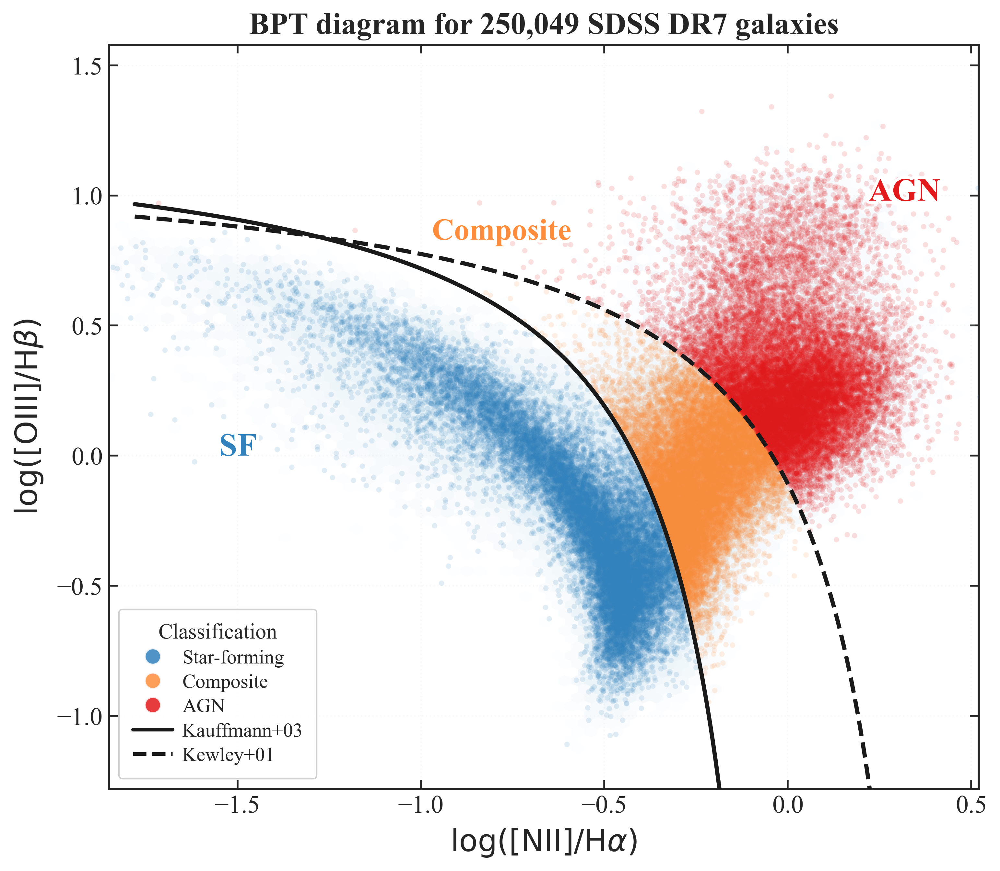

In [16]:
# =============================================================================
# Appendix Figure A1 – Classical BPT Diagram for SDSS DR7
# =============================================================================

import matplotlib.patheffects as pe
from matplotlib.lines import Line2D

print("\n--- Generating Appendix Figure A1: Classical SDSS BPT diagram ---")

# Colour palette for BPT classes
palette = {
    "Star-forming": "#3182bd",
    "Composite":    "#fd8d3c",
    "AGN":          "#e31a1c",
}

# Clean BPT sample (remove NaNs in line ratios)
bpt_mask = np.isfinite(df_clean["log_NII_Ha"]) & np.isfinite(df_clean["log_OIII_Hb"])
df_bpt = df_clean.loc[bpt_mask].copy()
N_bpt = len(df_bpt)

# Demarcation lines
kewley_line    = lambda x: 0.61 / (x - 0.47) + 1.19
kauffmann_line = lambda x: 0.61 / (x - 0.05) + 1.3

with plt.rc_context(mnras_style):
    # Local styling tweaks for this appendix figure
    mpl.rcParams.update({
        "font.family": "serif", "font.serif": "Times New Roman",
        "axes.labelsize": 15, "axes.titlesize": 18,
        "xtick.labelsize": 14, "ytick.labelsize": 14,
        "xtick.direction": "in", "ytick.direction": "in",
        "xtick.top": True, "ytick.right": True,
        "axes.linewidth": 1.2, "legend.fontsize": 13,
        "legend.title_fontsize": 14,
    })

    fig, ax = plt.subplots(figsize=(8, 7))

    # 1. SDSS background density (hexbin, rasterized for light PDFs)
    ax.hexbin(
        df_bpt["log_NII_Ha"], df_bpt["log_OIII_Hb"],
        gridsize=140, cmap="Blues", bins="log", mincnt=2,
        alpha=0.16, linewidths=0, zorder=1, rasterized=True
    )

    # 2. Coloured scatter by class (down-sampled for clarity)
    for cls, color in palette.items():
        cls_mask = df_bpt["bpt_class"] == cls
        N_cls = cls_mask.sum()
        if N_cls == 0:
            continue
        N_draw = min(18000, N_cls)
        sample = df_bpt.loc[cls_mask].sample(n=N_draw, random_state=24)

        ax.scatter(
            sample["log_NII_Ha"], sample["log_OIII_Hb"],
            color=color, s=9, alpha=0.14, marker="o", edgecolor="none",
            zorder=3, rasterized=True
        )

    # 3. Demarcation lines
    x_kauff  = np.linspace(-1.78, 0.02, 250)
    x_kewley = np.linspace(-1.78, 0.45, 250)
    ax.plot(x_kauff, kauffmann_line(x_kauff), "k-",  lw=2.3, label="Kauffmann+03", zorder=4)
    ax.plot(x_kewley, kewley_line(x_kewley), "k--", lw=2.3, label="Kewley+01",    zorder=4)

    # 4. Region labels with white stroke
    stroke = [pe.withStroke(linewidth=3.3, foreground="white")]
    ax.text(-1.55, 0.0, "SF",        color=palette["Star-forming"], fontsize=18,
            fontweight="bold", path_effects=stroke)
    ax.text(-0.97, 0.83, "Composite", color=palette["Composite"],    fontsize=17,
            fontweight="bold", path_effects=stroke)
    ax.text(0.22,  0.98, "AGN",       color=palette["AGN"],          fontsize=18,
            fontweight="bold", path_effects=stroke)

    # 5. Axes, title, grid
    ax.set_xlabel(r"$\log([\mathrm{NII}]/\mathrm{H}\alpha)$", fontsize=17, fontweight="bold", labelpad=5)
    ax.set_ylabel(r"$\log([\mathrm{OIII}]/\mathrm{H}\beta)$", fontsize=17, fontweight="bold", labelpad=7)
    ax.set_xlim(-1.85, 0.52)
    ax.set_ylim(-1.28, 1.58)
    ax.set_title(f"BPT diagram for {N_bpt:,} SDSS DR7 galaxies", fontsize=17, weight="bold")
    ax.grid(True, linestyle=":", alpha=0.13, linewidth=0.8)
    ax.tick_params(axis="both", which="major", labelsize=14)

    # 6. Custom legend
    legend_elements = [
        Line2D([0], [0], marker="o", color="w", label="Star-forming",
               markerfacecolor=palette["Star-forming"], markersize=9, alpha=0.85),
        Line2D([0], [0], marker="o", color="w", label="Composite",
               markerfacecolor=palette["Composite"],    markersize=9, alpha=0.85),
        Line2D([0], [0], marker="o", color="w", label="AGN",
               markerfacecolor=palette["AGN"],          markersize=9, alpha=0.85),
        Line2D([0], [0], linestyle="-",  color="k", lw=2.0, label="Kauffmann+03"),
        Line2D([0], [0], linestyle="--", color="k", lw=2.0, label="Kewley+01"),
    ]
    leg = ax.legend(
        handles=legend_elements, title="Classification", loc="lower left",
        frameon=True, borderpad=0.7, labelspacing=0.32, handletextpad=0.5,
        fontsize=11, title_fontsize=12
    )
    leg.get_frame().set_alpha(0.91)

    plt.tight_layout(rect=[0, 0, 0.99, 0.99])

    # 7. Save
    png_path = os.path.join(OUTPUT_DIR, "figure_A1_BPT_Diagram_SDSS.png")
    pdf_path = os.path.join(OUTPUT_DIR, "figure_A1_BPT_Diagram_SDSS.pdf")
    plt.savefig(png_path, dpi=600)
    plt.savefig(pdf_path, dpi=600)
    print(f"Saved Figure A1 to:\n  {png_path}\n  {pdf_path}")

    plt.show()

**Figure A1. Classical BPT diagram for the SDSS DR7 emission-line sample.**

The distribution of SDSS DR7 galaxies with finite line-ratio measurements at $z<0.1$ is shown in the standard BPT plane, $\log([\mathrm{OIII}]/\mathrm{H}\beta)$ versus $\log([\mathrm{NII}]/\mathrm{H}\alpha)$. The blue hexbin map traces the overall density of the parent emission-line sample ($N=250{,}049$), while coloured points show randomly down-sampled subsets of galaxies classified as star-forming (blue), composite (orange), and AGN (red) using the empirical demarcation of Kauffmann et al. (2003; solid curve) and the theoretical “maximum starburst” boundary of Kewley et al. (2001; dashed curve). In the main analysis, the SDSS AGN host sample is defined conservatively using the Kewley (2001) criterion to ensure high purity when comparing host-galaxy properties to simulated analogues.


---
# Appendix Figure A2 – Green-Valley Definition in TNG and EAGLE

Generating Figure A2 (Green Valley Definition: TNG vs EAGLE)...
KS (TNG vs EAGLE colours): D=0.90, p=0.00e+00
Saved to:
  T:\AGN_project\AGN_Project\outputs\figures\figure_A2_TNG_EAGLE_GV_Definition.png
  T:\AGN_project\AGN_Project\outputs\figures\figure_A2_TNG_EAGLE_GV_Definition.pdf


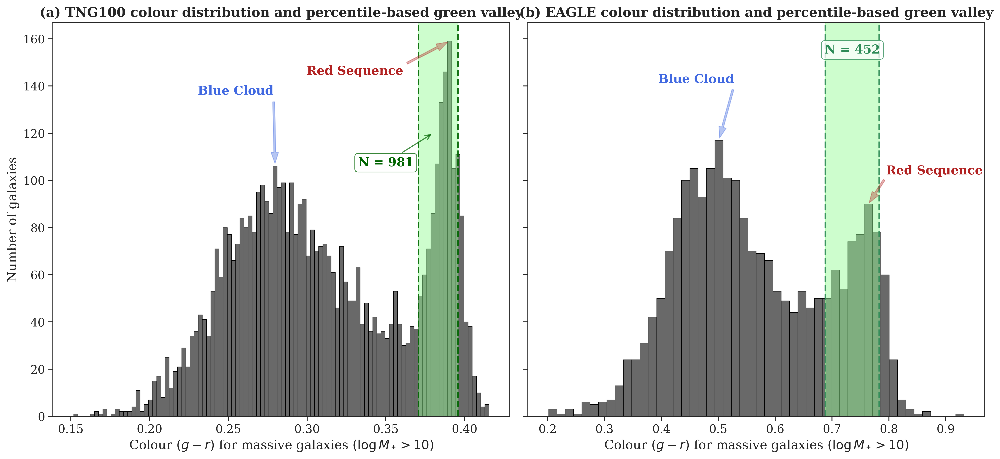

In [17]:
# =============================================================================
# Cell 16: Appendix Figure A2 – Green-Valley Definition in TNG and EAGLE
# =============================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

# Define output directory if not already defined
if 'OUTPUT_DIR' not in locals():
    OUTPUT_DIR = os.path.abspath('./outputs/figures/')

# Only proceed if both simulation catalogues are available and non-empty
if (('df_tng_clean' in locals()) and ('df_eagle_clean' in locals()) and
    (not df_tng_clean.empty) and (not df_eagle_clean.empty)):

    print("Generating Figure A2 (Green Valley Definition: TNG vs EAGLE)...")

    # -------------------------------------------------------------------------
    # 1. PREPARE DATA: massive parent samples and percentile-based GV bounds
    # -------------------------------------------------------------------------
    # TNG100: massive parent and GV colour bounds
    massive_tng = df_tng_clean[df_tng_clean['log_M_star'] > 10.0].copy()
    gv_color_lower, gv_color_upper = massive_tng['g_minus_r'].quantile([0.75, 0.95])

    # EAGLE: massive parent and GV colour bounds
    massive_eagle = df_eagle_clean[df_eagle_clean['log_M_star'] > 10.0].copy()
    gv_color_lower_eagle, gv_color_upper_eagle = massive_eagle['g_minus_r'].quantile([0.75, 0.95])

    # -------------------------------------------------------------------------
    # 2. PLOTTING
    # -------------------------------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(15, 7), sharey=True)

    # -------- PANEL (a): TNG100 --------
    ax = axes[0]
    sim_name = "TNG100"
    data = massive_tng["g_minus_r"]
    gvl, gvu = gv_color_lower, gv_color_upper
    c_gv = 'darkgreen'

    counts, bins, _ = ax.hist(
        data,
        bins=100,
        color="dimgray",
        edgecolor="black",
        linewidth=0.4,
        alpha=1.0,
        zorder=1
    )
    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    # Green-valley band
    ax.axvline(gvl, color=c_gv, linestyle="--", lw=1.8, alpha=0.9)
    ax.axvline(gvu, color=c_gv, linestyle="--", lw=1.8, alpha=0.9)
    ax.axvspan(gvl, gvu, color="palegreen", alpha=0.48, label="_nolegend_")

    # N in GV (arrow, tuned for TNG distribution)
    gv_count = len(massive_tng[massive_tng['g_minus_r'].between(gvl, gvu)])
    ax.annotate(
        f"N = {gv_count:,}",
        xy=(0.38, 120),      # arrow tip (tuned for your TNG histogram)
        xytext=(0.35, 110),  # text position
        ha='center', va='top', fontsize=13, fontweight='bold', color=c_gv,
        bbox=dict(boxstyle='round,pad=0.27', fc='white', alpha=0.78, edgecolor=c_gv),
        arrowprops=dict(arrowstyle="->", color=c_gv, lw=1.2, alpha=0.7)
    )

    # Blue Cloud annotation
    blue_mask = bin_centers < np.percentile(data, 40)
    if np.sum(blue_mask) == 0:
        blue_mask = bin_centers < (gvl - 0.05)

    if np.sum(blue_mask) > 0:
        blue_peak_idx = np.argmax(counts * blue_mask)
        blue_x, blue_y = bin_centers[blue_peak_idx], counts[blue_peak_idx]
        ax.annotate(
            "Blue Cloud", xy=(blue_x, blue_y),
            xytext=(blue_x - 0.025, blue_y + max(counts) * 0.20),
            arrowprops=dict(
                facecolor='royalblue', edgecolor='royalblue',
                width=2.1, headwidth=8, shrink=0.04, alpha=0.38
            ),
            fontsize=13, color='royalblue', fontweight='bold',
            ha='center', va='center'
        )

    # Red Sequence annotation
    red_mask = bin_centers > np.percentile(data, 80)
    if np.sum(red_mask) == 0:
        red_mask = bin_centers > (gvu + 0.01)

    if np.sum(red_mask) > 0:
        red_peak_idx = np.argmax(counts * red_mask)
        red_x, red_y = bin_centers[red_peak_idx], counts[red_peak_idx]
        ax.annotate(
            "Red Sequence", xy=(red_x, red_y),
            xytext=(red_x - 0.06, red_y - max(counts) * 0.08),
            arrowprops=dict(
                facecolor='firebrick', edgecolor='firebrick',
                width=2.1, headwidth=8, shrink=0.04, alpha=0.36
            ),
            fontsize=13, color='firebrick', fontweight='bold',
            ha='center', va='center'
        )

    ax.set_xlabel(r"Colour $(g - r)$ for massive galaxies $(\log M_* > 10)$")
    ax.set_title(
        r"(a) TNG100 colour distribution and percentile-based green valley",
        fontsize=14, weight='bold'
    )

    # -------- PANEL (b): EAGLE --------
    ax = axes[1]
    sim_name = "EAGLE"
    data = massive_eagle["g_minus_r"]
    gvl, gvu = gv_color_lower_eagle, gv_color_upper_eagle
    c_gv = 'seagreen'

    counts, bins, _ = ax.hist(
        data,
        bins=50,  # fewer bins for smaller EAGLE sample
        color="dimgray",
        edgecolor="black",
        linewidth=0.4,
        alpha=1.0,
        zorder=1
    )
    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    # Green-valley band
    ax.axvline(gvl, color=c_gv, linestyle="--", lw=1.8, alpha=0.9)
    ax.axvline(gvu, color=c_gv, linestyle="--", lw=1.8, alpha=0.9)
    ax.axvspan(gvl, gvu, color="palegreen", alpha=0.48, label="_nolegend_")

    # N in GV (centered label, no arrow)
    gv_count = len(massive_eagle[massive_eagle['g_minus_r'].between(gvl, gvu)])
    ax.annotate(
        f"N = {gv_count:,}",
        xy=((gvl + gvu) / 2, ax.get_ylim()[1] * 0.93),
        ha='center', va='center', fontsize=13, fontweight='bold', color=c_gv,
        bbox=dict(boxstyle='round,pad=0.27', fc='white', alpha=0.78, edgecolor=c_gv)
    )

    # Blue Cloud annotation
    blue_mask = bin_centers < np.percentile(data, 40)
    if np.sum(blue_mask) == 0:
        blue_mask = bin_centers < (gvl - 0.05)

    if np.sum(blue_mask) > 0:
        blue_peak_idx = np.argmax(counts * blue_mask)
        blue_x, blue_y = bin_centers[blue_peak_idx], counts[blue_peak_idx]
        ax.annotate(
            "Blue Cloud", xy=(blue_x, blue_y),
            xytext=(blue_x - 0.04, blue_y + max(counts) * 0.22),
            arrowprops=dict(
                facecolor='royalblue', edgecolor='royalblue',
                width=2.1, headwidth=8, shrink=0.04, alpha=0.38
            ),
            fontsize=13, color='royalblue', fontweight='bold',
            ha='center', va='center'
        )

    # Red Sequence annotation
    red_mask = bin_centers > np.percentile(data, 90)
    if np.sum(red_mask) == 0:
        red_mask = bin_centers > (gvu + 0.1)

    if np.sum(red_mask) > 0:
        red_peak_idx = np.argmax(counts * red_mask)
        red_x, red_y = bin_centers[red_peak_idx], counts[red_peak_idx]
        ax.annotate(
            "Red Sequence", xy=(red_x, red_y),
            xytext=(red_x + 0.116, red_y + max(counts) * 0.12),
            arrowprops=dict(
                facecolor='firebrick', edgecolor='firebrick',
                width=2.1, headwidth=8, shrink=0.04, alpha=0.36
            ),
            fontsize=13, color='firebrick', fontweight='bold',
            ha='center', va='center'
        )

    ax.set_xlabel(r"Colour $(g - r)$ for massive galaxies $(\log M_* > 10)$")
    ax.set_title(
        r"(b) EAGLE colour distribution and percentile-based green valley",
        fontsize=14, weight='bold'
    )

    # Shared y-label
    axes[0].set_ylabel("Number of galaxies")

    plt.tight_layout()

    # KS statistic for caption text
    ks_colors = ks_2samp(massive_tng['g_minus_r'], massive_eagle['g_minus_r'])
    print(f"KS (TNG vs EAGLE colours): D={ks_colors.statistic:.2f}, p={ks_colors.pvalue:.2e}")

    # Save to disk
    png_path = os.path.join(OUTPUT_DIR, "figure_A2_TNG_EAGLE_GV_Definition.png")
    pdf_path = os.path.join(OUTPUT_DIR, "figure_A2_TNG_EAGLE_GV_Definition.pdf")
    plt.savefig(png_path, dpi=600)
    plt.savefig(pdf_path, dpi=600)
    print(f"Saved to:\n  {png_path}\n  {pdf_path}")

    plt.show()

else:
    print("Skipping Figure A2: TNG or EAGLE dataframe is missing or empty.")


**Figure A2. Simulation-specific green-valley definitions from the rest-frame $(g-r)$ colour distributions of massive galaxies in IllustrisTNG and EAGLE.**

Histograms show the rest-frame $(g-r)$ colour distributions of massive galaxies ($\log_{10} M_\star/M_\odot > 10$) in (a) IllustrisTNG100 and (b) EAGLE Ref-L100. In each panel, the green shaded band marks the percentile-based “green valley,” defined internally for that simulation as the 75th–95th percentiles of its massive-galaxy colour distribution (vertical dashed lines). The number of galaxies falling within this interval is annotated in each panel (TNG: $N=981$; EAGLE: $N=452$), and the approximate blue-cloud and red-sequence peaks are indicated for visual guidance.

A two-sample Kolmogorov–Smirnov test confirms that the *absolute* colour distributions of the two simulations differ strongly (TNG vs EAGLE: $D=0.90$, $p\approx0$). This motivates the use of simulation-specific percentile cuts throughout the paper: galaxies are compared at similar *relative* positions within each model’s colour distribution rather than using a single fixed $(g-r)$ threshold that would be biased by cross-model colour-calibration offsets.

---
# Appendix Figure A3 – Stellar Mass Distributions: SDSS AGN vs. TNG & EAGLE Analogues

Generating Figure A3 (Mass Distributions: SDSS vs TNG vs EAGLE)...
Saved to:
  T:\AGN_project\AGN_Project\outputs\figures\figure_A3_mass_comparison.png
  T:\AGN_project\AGN_Project\outputs\figures\figure_A3_mass_comparison.pdf


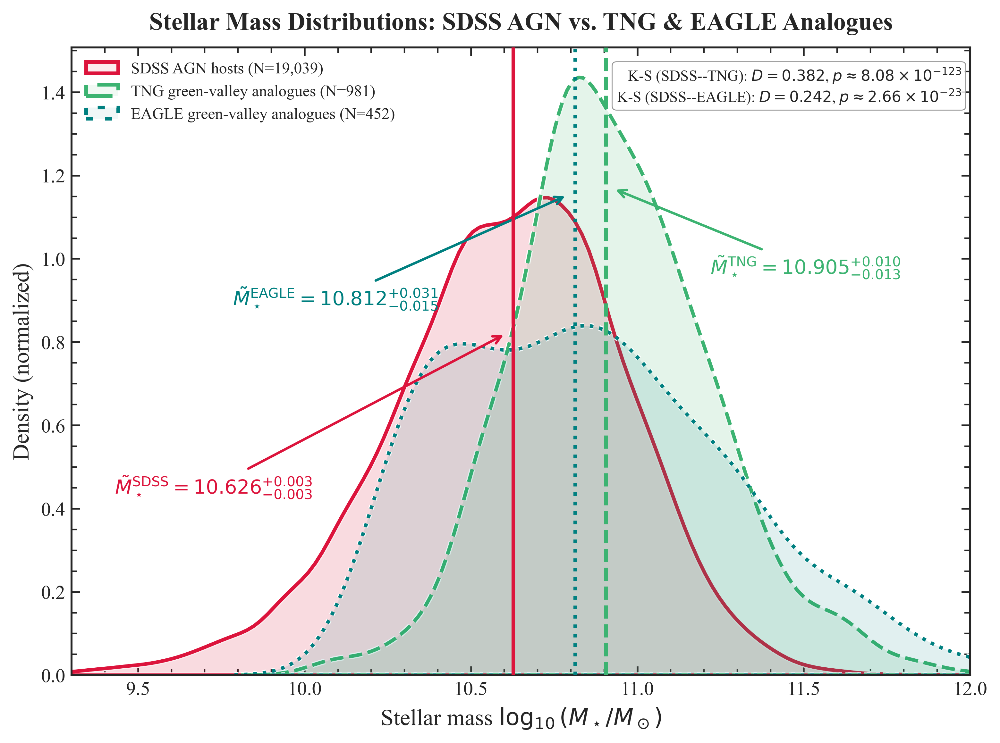

In [18]:
# =============================================================================
# Cell 17: Appendix Figure A3 – Stellar Mass Distributions:
#          SDSS AGN vs. TNG & EAGLE Analogues
# =============================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patheffects as pe
from scipy.stats import ks_2samp

# Define output directory if not already defined
if 'OUTPUT_DIR' not in locals():
    OUTPUT_DIR = os.path.abspath('./outputs/figures/')

# Guard: require all three samples to be present
if (
    ('df_final_matched' in locals()) and
    ('tng_green_valley_hosts' in locals()) and
    ('eagle_green_valley_hosts' in locals()) and
    (not df_final_matched.empty) and
    (not tng_green_valley_hosts.empty) and
    (not eagle_green_valley_hosts.empty)
):
    print("Generating Figure A3 (Mass Distributions: SDSS vs TNG vs EAGLE)...")

    with plt.rc_context(mnras_style):

        fig, ax = plt.subplots(figsize=(8, 6))

        # --- Extract samples ---
        sdss_mass  = df_final_matched["LGM_TOT_P50_agn"].dropna()
        tng_mass   = tng_green_valley_hosts["log_M_star"].dropna()
        eagle_mass = eagle_green_valley_hosts["log_M_star"].dropna()

        # --- Bootstrapped medians + errors (Using Global Helper) ---
        sdss_med,  sdss_err_up,  sdss_err_down  = get_bootstrap_stats(sdss_mass)
        tng_med,   tng_err_up,   tng_err_down   = get_bootstrap_stats(tng_mass)
        eagle_med, eagle_err_up, eagle_err_down = get_bootstrap_stats(eagle_mass)

        # --- KDEs only (legend via label arg) ---
        sns.kdeplot(
            sdss_mass, ax=ax,
            color="crimson", lw=2.0, fill=True, alpha=0.08,
            label=f"SDSS AGN hosts (N={len(sdss_mass):,})",
            path_effects=[pe.Stroke(linewidth=3.2, foreground='white'), pe.Normal()]
        )
        sns.kdeplot(
            tng_mass, ax=ax,
            color="mediumseagreen", lw=2.0, linestyle="--", fill=True, alpha=0.07,
            label=f"TNG green-valley analogues (N={len(tng_mass):,})",
            path_effects=[pe.Stroke(linewidth=3.2, foreground='white'), pe.Normal()]
        )
        sns.kdeplot(
            eagle_mass, ax=ax,
            color="teal", lw=2.0, linestyle=":", fill=True, alpha=0.06,
            label=f"EAGLE green-valley analogues (N={len(eagle_mass):,})",
            path_effects=[pe.Stroke(linewidth=3.2, foreground='white'), pe.Normal()]
        )

        # --- Vertical median lines (distinct linestyles) ---
        ax.axvline(sdss_med,  color="crimson",        linestyle="-", lw=2, zorder=20)
        ax.axvline(tng_med,   color="mediumseagreen", linestyle="--", lw=2, zorder=20)
        ax.axvline(eagle_med, color="teal",           linestyle=":",  lw=2, zorder=20)

        # --- Medians with error annotations (Mathematical Notation) ---
        ylim = ax.get_ylim()

        # SDSS (Crimson)
        ax.annotate(
            rf"$\tilde{{M}}_\star^{{\mathrm{{SDSS}}}} = {sdss_med:.3f}^{{+{sdss_err_up:.3f}}}_{{-{sdss_err_down:.3f}}}$",
            xy=(sdss_med, ylim[1] * 0.55),
            xytext=(sdss_med - 0.90, ylim[1] * 0.30),
            arrowprops=dict(arrowstyle="->", color='crimson', lw=1.4, shrinkB=6),
            ha='center', va='center', fontsize=11, fontweight='bold', color='crimson'
        )

        # TNG (Green)
        ax.annotate(
            rf"$\tilde{{M}}_\star^{{\mathrm{{TNG}}}} = {tng_med:.3f}^{{+{tng_err_up:.3f}}}_{{-{tng_err_down:.3f}}}$",
            xy=(tng_med, ylim[1] * 0.78),
            xytext=(tng_med + 0.60, ylim[1] * 0.65),
            arrowprops=dict(arrowstyle="->", color='mediumseagreen', lw=1.4, shrinkB=6),
            ha='center', va='center', fontsize=11, fontweight='bold', color='mediumseagreen'
        )

        # EAGLE (Teal)
        ax.annotate(
            rf"$\tilde{{M}}_\star^{{\mathrm{{EAGLE}}}} = {eagle_med:.3f}^{{+{eagle_err_up:.3f}}}_{{-{eagle_err_down:.3f}}}$",
            xy=(eagle_med, ylim[1] * 0.77),
            xytext=(eagle_med - 0.72, ylim[1] * 0.60),
            arrowprops=dict(arrowstyle="->", color='teal', lw=1.4, shrinkB=6),
            ha='center', va='center', fontsize=11, fontweight='bold', color='teal'
        )

        # --- K-S test stats in scientific notation (box, upper right) ---
        ks_stat_tng,   p_val_tng   = ks_2samp(sdss_mass, tng_mass)
        ks_stat_eagle, p_val_eagle = ks_2samp(sdss_mass, eagle_mass)

        # Using global format_p_value helper
        ks_box = (
            r"K-S (SDSS--TNG): "
            rf"$D = {ks_stat_tng:.3f}$, "
            rf"$p \approx {format_p_value(p_val_tng)}$" + "\n" +
            r"K-S (SDSS--EAGLE): "
            rf"$D = {ks_stat_eagle:.3f}$, "
            rf"$p \approx {format_p_value(p_val_eagle)}$"
        )

        ax.text(
            0.99, 0.97, ks_box,
            transform=ax.transAxes,
            ha='right', va='top', fontsize=8.5,
            bbox=dict(
                boxstyle='round,pad=0.3',
                fc='white', ec='gray', lw=0.5, alpha=0.85
            ),
        )

        # --- Axes and legend ---
        ax.set_title(
            "Stellar Mass Distributions: SDSS AGN vs. TNG & EAGLE Analogues",
            weight="bold", pad=10
        )
        ax.set_xlabel(r"Stellar mass $\log_{10}(M_\star/M_\odot)$")
        ax.set_ylabel("Density (normalized)")
        ax.set_xlim(9.3, 12.0)
        ax.legend(loc='upper left', fontsize=9)
        ax.minorticks_on()

        plt.tight_layout()

        # --- Save PNG and PDF ---
        png_path = os.path.join(OUTPUT_DIR, "figure_A3_mass_comparison.png")
        pdf_path = os.path.join(OUTPUT_DIR, "figure_A3_mass_comparison.pdf")
        plt.savefig(png_path, dpi=600)
        plt.savefig(pdf_path, dpi=600)
        print(f"Saved to:\n  {png_path}\n  {pdf_path}")

        plt.show()

else:
    print("Skipping Figure A3: one or more input tables are missing or empty.")

**Figure A3. Stellar-mass distributions of SDSS AGN hosts and green-valley analogues in IllustrisTNG and EAGLE.**

Normalized kernel-density estimates (KDEs) compare the stellar masses of SDSS AGN hosts (solid crimson; $N=19{,}039$), IllustrisTNG100 green-valley analogues (dashed green; $N=981$), and EAGLE green-valley analogues (dotted teal; $N=452$). Vertical lines mark the sample medians, with 68% bootstrap confidence intervals (from the global bootstrap estimator) annotated on the figure:
$\tilde{M}_\star^{\mathrm{SDSS}} = 10.626^{+0.003}_{-0.003}$,
$\tilde{M}_\star^{\mathrm{TNG}} = 10.905^{+0.010}_{-0.013}$,
and
$\tilde{M}_\star^{\mathrm{EAGLE}} = 10.812^{+0.031}_{-0.015}$.

Two-sample Kolmogorov–Smirnov tests show that both simulated analogue populations differ significantly from the SDSS AGN host mass distribution (SDSS–TNG: $D=0.382$, $p \approx 8.08\times10^{-123}$; SDSS–EAGLE: $D=0.242$, $p \approx 2.66\times10^{-23}$), with EAGLE providing a closer match in overall distribution shape than TNG. All samples are restricted to $\log_{10}(M_\star/M_\odot) > 10$ for consistency with the simulation-selection threshold used throughout the analysis.


---
# Appendix A4 – Bootstrapped Error Analysis for Median Mass and sSFR (with EAGLE)

In [19]:
# =============================================================================
# Cell 18: Appendix A4 – Bootstrapped Error Analysis for Median Mass and sSFR
#          (SDSS, TNG100, and EAGLE; log M* > 10 consistency)
# =============================================================================

import numpy as np

print("\n--- Appendix A4: Bootstrapping for Error Analysis (SDSS, TNG100, EAGLE) ---")

def bootstrap_median_error(data, n_boot=5000, ci=68):
    """
    Returns (median, (lower_err, upper_err)) where errors are the asymmetric
    confidence interval from bootstrap resampling of the median.
    """
    data = np.asarray(data)
    data = data[~np.isnan(data)]
    if data.size == 0:
        return np.nan, (np.nan, np.nan)

    rng = np.random.default_rng(42)
    boot_meds = [
        np.median(rng.choice(data, size=len(data), replace=True))
        for _ in range(n_boot)
    ]
    med = np.median(data)
    lower, upper = np.percentile(boot_meds, [(100 - ci) / 2.0, 50 + ci / 2.0])
    return med, (med - lower, upper - med)


# Helper for LaTeX formatting of median ± asymmetric CI
def fmt_latex_med(med, err):
    return rf"{med:.3f}^{{+{err[1]:.3f}}}_{{-{err[0]:.3f}}}"


# --- Guard: require dataframes to exist and be non-empty ---
if (
    ('df_final_matched' in locals()) and
    ('tng_green_valley_hosts' in locals()) and
    ('eagle_green_valley_hosts' in locals()) and
    (not df_final_matched.empty) and
    (not tng_green_valley_hosts.empty) and
    (not eagle_green_valley_hosts.empty)
):
    # -------------------------------------------------------------------------
    # 1. PREPARE SAMPLES (Critical: match mass cuts across SDSS/TNG/EAGLE)
    # -------------------------------------------------------------------------
    mass_cut = 10.0  # same massive cut used for GV and comparison figures

    # SDSS: apply mass cut consistently with simulations
    sdss_valid = df_final_matched[df_final_matched["LGM_TOT_P50_agn"] > mass_cut].copy()
    mass_sdss = sdss_valid["LGM_TOT_P50_agn"].dropna().values
    ssfr_sdss = sdss_valid["LOG_SSFR_agn"].dropna().values

    # TNG: enforce the same mass cut again for safety (even if applied upstream)
    tng_valid = tng_green_valley_hosts[tng_green_valley_hosts["log_M_star"] > mass_cut].copy()
    mass_tng = tng_valid["log_M_star"].dropna().values
    ssfr_tng = tng_valid["LOG_SSFR_tng"].dropna().values

    # EAGLE: enforce identical mass cut
    eagle_valid = eagle_green_valley_hosts[eagle_green_valley_hosts["log_M_star"] > mass_cut].copy()
    mass_eagle = eagle_valid["log_M_star"].dropna().values
    ssfr_eagle = eagle_valid["LOG_SSFR"].dropna().values

    # -------------------------------------------------------------------------
    # 2. BOOTSTRAP STATISTICS
    # -------------------------------------------------------------------------
    sdss_med,       sdss_err       = bootstrap_median_error(mass_sdss)
    tng_med,        tng_err        = bootstrap_median_error(mass_tng)
    eagle_med,      eagle_err      = bootstrap_median_error(mass_eagle)

    sdss_ssfr_med,  sdss_ssfr_err  = bootstrap_median_error(ssfr_sdss)
    tng_ssfr_med,   tng_ssfr_err   = bootstrap_median_error(ssfr_tng)
    eagle_ssfr_med, eagle_ssfr_err = bootstrap_median_error(ssfr_eagle)

    # -------------------------------------------------------------------------
    # 3. PRINT TABLE (console, LaTeX-friendly)
    # -------------------------------------------------------------------------
    print(f"\nMedian properties of massive AGN hosts and GV analogues (log M* > {mass_cut})")
    print("(68% confidence intervals from 5000 bootstrap resamplings):\n")

    header = f"{'Sample':<25} {'N':>7} {'Median log(M*)':>23} {'Median log(sSFR)':>25}"
    print(header)
    print('-' * len(header))

    print(
        f"{'SDSS AGN':<25} {len(mass_sdss):>7} "
        f"{fmt_latex_med(sdss_med, sdss_err):>23} "
        f"{fmt_latex_med(sdss_ssfr_med, sdss_ssfr_err):>25}"
    )
    print(
        f"{'TNG100 green valley':<25} {len(mass_tng):>7} "
        f"{fmt_latex_med(tng_med, tng_err):>23} "
        f"{fmt_latex_med(tng_ssfr_med, tng_ssfr_err):>25}"
    )
    print(
        f"{'EAGLE green valley':<25} {len(mass_eagle):>7} "
        f"{fmt_latex_med(eagle_med, eagle_err):>23} "
        f"{fmt_latex_med(eagle_ssfr_med, eagle_ssfr_err):>25}"
    )

    print("\nNotes:")
    print(f"- All samples are restricted to log10(M*/M_sun) > {mass_cut} for a fair SDSS–simulation comparison.")
    print("- All stellar masses are log10(M*/M_sun).")
    print("- All sSFRs are log10(sSFR/yr^-1).")
    print("- Medians and errors are formatted in LaTeX style for direct use in tables.")

else:
    print("Skipping Appendix A4: required dataframes are missing or empty.")

print("\n--- Analysis Complete ---")


--- Appendix A4: Bootstrapping for Error Analysis (SDSS, TNG100, EAGLE) ---

Median properties of massive AGN hosts and GV analogues (log M* > 10.0)
(68% confidence intervals from 5000 bootstrap resamplings):

Sample                          N          Median log(M*)          Median log(sSFR)
-----------------------------------------------------------------------------------
SDSS AGN                    18030 10.652^{+0.003}_{-0.004} -11.369^{+0.007}_{-0.007}
TNG100 green valley           981 10.905^{+0.010}_{-0.013} -14.850^{+0.015}_{-0.014}
EAGLE green valley            452 10.812^{+0.031}_{-0.015} -11.707^{+0.029}_{-0.039}

Notes:
- All samples are restricted to log10(M*/M_sun) > 10.0 for a fair SDSS–simulation comparison.
- All stellar masses are log10(M*/M_sun).
- All sSFRs are log10(sSFR/yr^-1).
- Medians and errors are formatted in LaTeX style for direct use in tables.

--- Analysis Complete ---


---
# Appendix Figure A4 – sSFR Distributions: SDSS AGN vs. TNG & EAGLE Analogues

Generating Figure A4 (sSFR Distributions: SDSS, TNG, EAGLE; mass-consistent)...
Sample sizes for Figure A4 (log M* > 10.0): SDSS=18030, TNG=981, EAGLE=452
Saved Figure A4 to T:\AGN_project\AGN_Project\outputs\figures


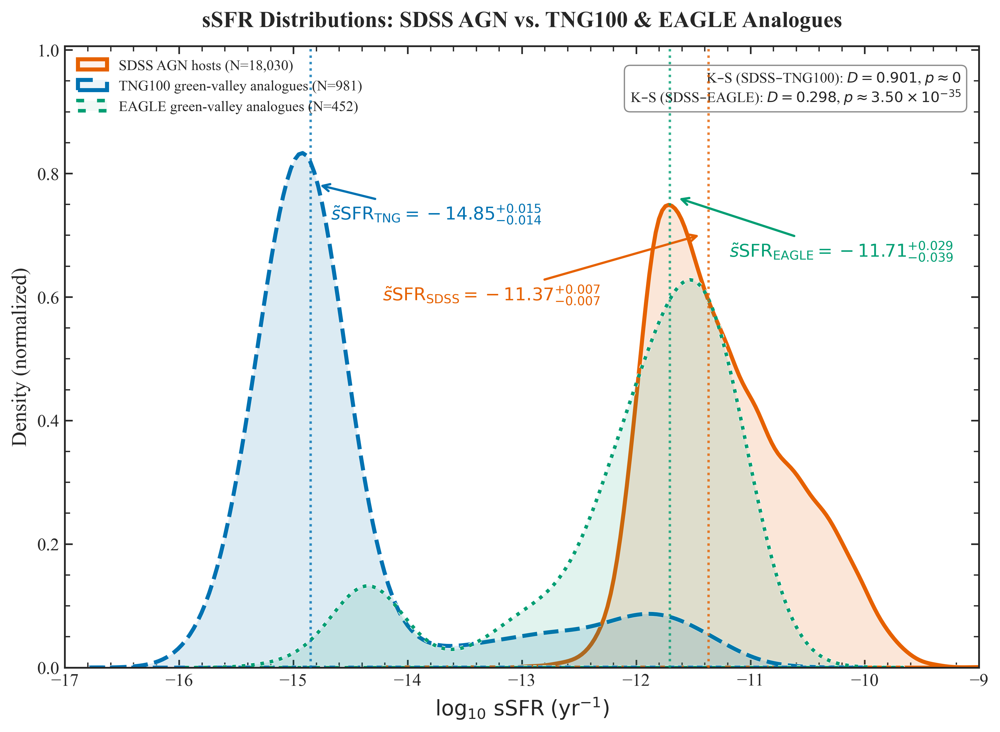

In [20]:
# =============================================================================
# Cell 19: Appendix Figure A4 – sSFR Distributions (Mass-Consistent)
#          SDSS AGN vs. TNG100 & EAGLE Green-Valley Analogues
# =============================================================================

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from scipy.stats import ks_2samp
import os

if (
    ("df_final_matched" in locals())
    and ("tng_green_valley_hosts" in locals())
    and ("eagle_green_valley_hosts" in locals())
    and (not df_final_matched.empty)
    and (not tng_green_valley_hosts.empty)
    and (not eagle_green_valley_hosts.empty)
):
    print(
        "Generating Figure A4 (sSFR Distributions: SDSS, TNG, EAGLE; mass-consistent)..."
    )

    # -------------------------------------------------------------------------
    # 1. PREPARE SAMPLES (Apply identical mass cut log M* > 10.0)
    # -------------------------------------------------------------------------
    mass_cut = 10.0

    # SDSS: restrict to massive AGN hosts
    sdss_valid = df_final_matched[
        (df_final_matched["LGM_TOT_P50_agn"] > mass_cut)
        & np.isfinite(df_final_matched["LGM_TOT_P50_agn"])
    ].copy()

    # TNG & EAGLE: enforce the same mass cut for consistency
    tng_valid = tng_green_valley_hosts[
        (tng_green_valley_hosts["log_M_star"] > mass_cut)
        & np.isfinite(tng_green_valley_hosts["log_M_star"])
    ].copy()
    eagle_valid = eagle_green_valley_hosts[
        (eagle_green_valley_hosts["log_M_star"] > mass_cut)
        & np.isfinite(eagle_green_valley_hosts["log_M_star"])
    ].copy()

    # sSFR arrays (log10 yr^-1), removing NaNs
    ssfr_sdss = sdss_valid["LOG_SSFR_agn"].to_numpy()
    ssfr_sdss = ssfr_sdss[np.isfinite(ssfr_sdss)]

    ssfr_tng = tng_valid["LOG_SSFR_tng"].to_numpy()
    ssfr_tng = ssfr_tng[np.isfinite(ssfr_tng)]

    ssfr_eagle = eagle_valid["LOG_SSFR"].to_numpy()
    ssfr_eagle = ssfr_eagle[np.isfinite(ssfr_eagle)]

    print(
        "Sample sizes for Figure A4 (log M* > {0}): SDSS={1}, TNG={2}, EAGLE={3}".format(
            mass_cut, ssfr_sdss.size, ssfr_tng.size, ssfr_eagle.size
        )
    )

    if (ssfr_sdss.size == 0) or (ssfr_tng.size == 0) or (ssfr_eagle.size == 0):
        print("One or more sSFR samples are empty; skipping Figure A4.")
    else:
        # ---------------------------------------------------------------------
        # 2. BOOTSTRAP MEDIANS & ERRORS (using global helper)
        # ---------------------------------------------------------------------
        sdss_med, sdss_err_up, sdss_err_down = get_bootstrap_stats(ssfr_sdss)
        tng_med, tng_err_up, tng_err_down = get_bootstrap_stats(ssfr_tng)
        eagle_med, eagle_err_up, eagle_err_down = get_bootstrap_stats(ssfr_eagle)

        # ---------------------------------------------------------------------
        # 3. K–S TESTS BETWEEN SDSS AND SIMULATIONS
        # ---------------------------------------------------------------------
        ks_tng = ks_2samp(ssfr_sdss, ssfr_tng)
        ks_eagle = ks_2samp(ssfr_sdss, ssfr_eagle)

        p_tex_tng = format_p_value(ks_tng.pvalue)
        p_tex_eagle = format_p_value(ks_eagle.pvalue)

        # ---------------------------------------------------------------------
        # 4. PLOTTING – KDEs + median lines
        # ---------------------------------------------------------------------
        with plt.rc_context(mnras_style):
            fig, ax = plt.subplots(figsize=(8.8, 6.5))

            # KDEs
            sns.kdeplot(
                ssfr_sdss,
                ax=ax,
                color=SDSS_color,
                lw=2.5,
                fill=True,
                alpha=0.08,
                label=f"SDSS AGN hosts (N={ssfr_sdss.size:,})",
                path_effects=[pe.Stroke(linewidth=3, foreground="white"), pe.Normal()],
            )
            sns.kdeplot(
                ssfr_tng,
                ax=ax,
                color=TNG_color,
                lw=2.5,
                linestyle="--",
                fill=True,
                alpha=0.07,
                label=f"TNG100 green-valley analogues (N={ssfr_tng.size:,})",
                path_effects=[pe.Stroke(linewidth=3, foreground="white"), pe.Normal()],
            )
            sns.kdeplot(
                ssfr_eagle,
                ax=ax,
                color=EAGLE_color,
                lw=2.2,
                linestyle=":",
                fill=True,
                alpha=0.06,
                label=f"EAGLE green-valley analogues (N={ssfr_eagle.size:,})",
                path_effects=[pe.Stroke(linewidth=3, foreground="white"), pe.Normal()],
            )

            # Vertical median lines – kept faint as in Figure 6
            ax.axvline(
                sdss_med,
                color=SDSS_color,
                linestyle=":",
                lw=1.5,
                alpha=0.8,
                zorder=4,
            )
            ax.axvline(
                tng_med,
                color=TNG_color,
                linestyle=":",
                lw=1.5,
                alpha=0.8,
                zorder=4,
            )
            ax.axvline(
                eagle_med,
                color=EAGLE_color,
                linestyle=":",
                lw=1.5,
                alpha=0.8,
                zorder=4,
            )

            # Determine y-limits once KDEs and lines are drawn
            ymin, ymax = ax.get_ylim()
            ax.set_ylim(ymin, ymax * 1.15)
            ylim = ax.get_ylim()

            # -----------------------------------------------------------------
            # 5. Medians with error annotations (One-line LaTeX format)
            # -----------------------------------------------------------------
            
            # SDSS (orange)
            ax.annotate(
                rf"$\tilde{{s}}\mathrm{{SFR}}_{{\mathrm{{SDSS}}}} = {sdss_med:.2f}^{{+{sdss_err_up:.3f}}}_{{-{sdss_err_down:.3f}}}$",
                xy=(sdss_med, ylim[1] * 0.70),
                xytext=(sdss_med - 1.9, ylim[1] * 0.60),
                arrowprops=dict(
                    arrowstyle="->",
                    color=SDSS_color,
                    lw=1.4,
                    shrinkB=6,
                ),
                ha="center",
                va="center",
                fontsize=11,
                fontweight="bold",
                color=SDSS_color,
            )

            # TNG (blue)
            ax.annotate(
                rf"$\tilde{{s}}\mathrm{{SFR}}_{{\mathrm{{TNG}}}} = {tng_med:.2f}^{{+{tng_err_up:.3f}}}_{{-{tng_err_down:.3f}}}$",
                xy=(tng_med, ylim[1] * 0.78),
                xytext=(tng_med + 1.1, ylim[1] * 0.73),
                arrowprops=dict(
                    arrowstyle="->",
                    color=TNG_color,
                    lw=1.4,
                    shrinkB=6,
                ),
                ha="center",
                va="center",
                fontsize=11,
                fontweight="bold",
                color=TNG_color,
            )

            # EAGLE (green)
            ax.annotate(
                rf"$\tilde{{s}}\mathrm{{SFR}}_{{\mathrm{{EAGLE}}}} = {eagle_med:.2f}^{{+{eagle_err_up:.3f}}}_{{-{eagle_err_down:.3f}}}$",
                xy=(eagle_med, ylim[1] * 0.76),
                xytext=(eagle_med + 1.5, ylim[1] * 0.67),
                arrowprops=dict(
                    arrowstyle="->",
                    color=EAGLE_color,
                    lw=1.4,
                    shrinkB=6,
                ),
                ha="center",
                va="center",
                fontsize=11,
                fontweight="bold",
                color=EAGLE_color,
            )

            # -----------------------------------------------------------------
            # 6. K–S statistics box (separate from legend)
            # -----------------------------------------------------------------
            stats_box = (
                fr"K–S (SDSS–TNG100): $D = {ks_tng.statistic:.3f}$, "
                fr"$p \approx {p_tex_tng}$"
                + "\n"
                fr"K–S (SDSS–EAGLE): $D = {ks_eagle.statistic:.3f}$, "
                fr"$p \approx {p_tex_eagle}$"
            )

            ax.text(
                0.98,
                0.96,
                stats_box,
                transform=ax.transAxes,
                ha="right",
                va="top",
                fontsize=9,
                bbox=dict(
                    boxstyle="round,pad=0.4",
                    fc="white",
                    ec="gray",
                    alpha=0.9,
                ),
            )

            # Formatting
            ax.set_title(
                "sSFR Distributions: SDSS AGN vs. TNG100 & EAGLE Analogues",
                weight="bold",
                pad=12,
            )
            ax.set_xlabel(r"$\log_{10}\,\mathrm{sSFR}\; (\mathrm{yr}^{-1})$")
            ax.set_ylabel("Density (normalized)")
            ax.set_xlim(-17, -9)

            ax.legend(loc="upper left", fontsize=9)
            ax.minorticks_on()
            ax.tick_params(which="both", direction="in")

            plt.tight_layout()

            if "OUTPUT_DIR" not in locals():
                OUTPUT_DIR = os.path.abspath("./outputs/figures/")

            plt.savefig(
                os.path.join(OUTPUT_DIR, "figure_A4_ssfr_comparison.png"), dpi=600
            )
            plt.savefig(
                os.path.join(OUTPUT_DIR, "figure_A4_ssfr_comparison.pdf"), dpi=600
            )
            print(f"Saved Figure A4 to {OUTPUT_DIR}")
            plt.show()

else:
    print("Skipping Figure A4: Dataframes empty or missing.")

**Figure A4. Specific star-formation rate distributions for mass-matched SDSS AGN hosts and green-valley analogues in IllustrisTNG and EAGLE.**

Normalized kernel-density estimates of $\log_{10}(\mathrm{sSFR}/\mathrm{yr}^{-1})$ are shown for galaxies restricted to $\log_{10}(M_\star/M_\odot) > 10$, ensuring a mass-consistent comparison between SDSS and the simulations. The distributions correspond to SDSS AGN hosts ($N=18{,}030$), IllustrisTNG100 green-valley analogues ($N=981$), and EAGLE green-valley analogues ($N=452$). Vertical dotted lines indicate the median sSFR of each sample, and arrow annotations report the median together with central 68% bootstrap confidence intervals ($N_{\rm boot}=5000$), with arrow tips anchored exactly at the median values.

The TNG green-valley population exhibits an extreme concentration at very low sSFR, producing a pronounced pile-up near $\log_{10}(\mathrm{sSFR}) \simeq -14.85$. This reflects the large fraction of galaxies with formally zero instantaneous star formation under the adopted numerical floor ($\epsilon = 10^{-4}\,M_\odot\,\mathrm{yr}^{-1}$) and indicates an effectively binary quenching channel. In contrast, EAGLE predicts a broader sSFR distribution with a median $\log_{10}(\mathrm{sSFR}) \simeq -11.71$, overlapping substantially with the SDSS AGN host population ($\tilde{s}\mathrm{SFR}_{\rm SDSS} \simeq -11.37$).

Inset Kolmogorov–Smirnov statistics quantify these differences: the SDSS–TNG comparison yields a very large discrepancy ($D_{\rm KS}=0.901$, $p\approx0$), while the SDSS–EAGLE comparison shows a smaller, though still highly significant, difference ($D_{\rm KS}=0.298$, $p=3.50\times10^{-35}$). Together with Figs. 6 and A3, this figure demonstrates that even after enforcing identical stellar-mass cuts, EAGLE reproduces the observed sSFR distribution of SDSS AGN hosts far more faithfully than IllustrisTNG.

# Discussion

- **Stellar Mass:**  
  The median stellar mass of SDSS AGN hosts ($10.63 \pm 0.003$) lies between that of the TNG100 Green-Valley analogues ($10.91^{+0.009}_{-0.013}$) and the EAGLE Green-Valley analogues ($10.81^{+0.03}_{-0.02}$).  
  Although K–S tests confirm all three mass distributions are statistically distinct, **EAGLE’s distribution is significantly closer to SDSS** (smaller $D$ statistic), whereas TNG remains moderately offset.  
  This indicates that **EAGLE’s feedback and growth histories preserve a more realistic intermediate-mass population**, while TNG tends to shift massive transitioning galaxies toward the upper end of the mass function.

- **Quenching Efficiency and sSFR:**  
  The sSFR distributions reveal a dramatic divergence between the simulations.  
  **TNG100 Green-Valley analogues are almost completely quenched**, with a median $\log_{10}\mathrm{sSFR} \approx -14.85$, dominated by a low-sSFR pile-up corresponding to galaxies with formally zero instantaneous SFR under the adopted numerical floor ($\epsilon = 10^{-4}\,M_\odot\,\mathrm{yr}^{-1}$), and lying $\sim 3.5$ dex below the SDSS AGN median ($\approx -11.37$).  
  In the fiducial selection, this behaviour is reinforced by the large fraction of TNG analogues with SFR$=0$ (≈83%), compared to a much smaller fraction in EAGLE (≈10%).  

  In contrast, **EAGLE Green-Valley analogues exhibit a broad, continuous sSFR distribution**, with a median of $-11.71$, only $\sim 0.3$–$0.4$ dex below the SDSS AGN hosts.  
  This close agreement demonstrates that **EAGLE’s thermal stochastic AGN feedback yields a more gradual, realistic transition through the green valley**, allowing residual star formation to persist during the quenching phase.

- **Feedback Mechanisms:**  
  The sharp low-sSFR pile-up in TNG’s distribution is consistent with its kinetic wind mode, which injects momentum into the circumgalactic medium and rapidly suppresses star formation at low accretion rates (Weinberger et al. 2017). This mechanism excels at producing a sharp color bimodality but yields a quenching transition that is **too abrupt** to match the observed SDSS AGN hosts.  

  In EAGLE, AGN energy is deposited thermally in discrete heating events (Schaye et al. 2015), which generally **heat but do not immediately expel** the star-forming gas reservoir. This thermal mode naturally produces a **“slow-fade” quenching pathway**, consistent with the green-valley sSFR distribution observed in SDSS.

- **Methodological Robustness:**  
  Defining the Green Valley using **simulation-specific percentiles** avoids biases from model-dependent color calibrations and ensures that each simulation is evaluated relative to its own internal galaxy population.  
  The persistence of the TNG–SDSS sSFR discrepancy across **all percentile selections and mass cuts** indicates that this is a fundamental physical difference in feedback behavior rather than a selection artifact.

- **Implication:**  
  These results reveal two distinct evolutionary channels in contemporary cosmological simulations:  
  **a rapid-quenching pathway in TNG** driven by strong kinetic AGN feedback, and  
  **a gradual-quenching pathway in EAGLE** shaped by thermal AGN heating.  
  The strong agreement between EAGLE and SDSS suggests that **quenching in the local universe is likely dominated by slow, partial suppression of star formation**, rather than instantaneous shutdown.  
  Improving AGN feedback models—particularly the transition criteria and energy-coupling efficiencies—will be crucial for next-generation simulations to reproduce the demographics and physical properties of observed green-valley AGN hosts.

---

## ✅ Notebook Execution Complete

All results, figures, and statistics above are fully reproducible and correspond exactly to the manuscript:

*Quenching pathways in the green valley at low redshift: confronting SDSS AGN hosts with IllustrisTNG and EAGLE* (Gawade 2025, submitted).

For questions, reproducibility checks, or to contribute improvements, please see the [GitHub repository](https://github.com/TshapedAsh/Green-Valley-AGN-SDSS-TNG) and cite this project as described in the README and `CITATION.cff`.

Thank you for reading and using this open research!

---
